<a href="https://colab.research.google.com/github/emilijadjordjevic/nutriVision/blob/master/zadatak_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Food classification

Cilj je klasifikacija 30 Food-101 klasa i poredjenje nekoliko pristupa:
CNN od nule, feature extraction i fine-tuning pretrained modela.

Test skup ostavljam netaknut do finalnog izbora modela.

In [45]:
import random
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import torch.nn.functional as F

from torchvision.datasets import Food101
from torchvision.transforms import v2, InterpolationMode
from torch.utils.data import Dataset, Subset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report
from torchvision.models import resnet18, ResNet18_Weights, resnet50, ResNet50_Weights
import os
import zipfile
from google.colab import files


In [2]:
SEED = 29

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


### GPU

Proveravam da li je GPU dostupan pre treninga.

In [3]:
print("CUDA:", torch.cuda.is_available())
if torch.cuda.is_available():
    print(torch.cuda.get_device_name(0))


CUDA: True
Tesla T4


In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)


cuda


## Model backup

Checkpoint-e cuvam jer je trening skup. U novom runtime-u ih prvo vratim iz `models.zip`,
tako da ne treniram vec zavrsene modele ponovo.

In [5]:
requiredModels = [
    "modelA1_best.pth", "modelA1_last.pth",
    "modelA2_best.pth", "modelA2_last.pth",
    "modelB1_best.pth", "modelB1_last.pth",
    "modelB2_best.pth", "modelB1_last.pth",
    "modelB3_best.pth", "modelB2_last.pth",
    "modelB4_best.pth", "modelB2_last.pth"
]

if not all(os.path.exists(name) for name in requiredModels):
    uploaded = files.upload()
    zipName = next(name for name in uploaded if name.endswith(".zip"))

    with zipfile.ZipFile(zipName) as z:
        z.extractall(".")

    print("models restored")
else:
    print("models already in runtime")

for name in sorted(os.listdir(".")):
    if name.endswith(".pth"):
        print(name)

Saving models (3).zip to models (3).zip
models restored
modelA1_best.pth
modelA1_last.pth
modelA2_best.pth
modelA2_last.pth
modelB1_best.pth
modelB1_last.pth
modelB2_best.pth
modelB2_last.pth
modelB3_best.pth
modelB3_last.pth
modelB4_best.pth
modelB4_last.pth


In [6]:
def saveModels():
    modelFiles = sorted(
        name for name in os.listdir(".")
        if name.startswith("model") and name.endswith(".pth")
    )

    with zipfile.ZipFile("models.zip", "w") as z:
        for name in modelFiles:
            z.write(name)

    print("saved:", *modelFiles, sep="\n")
    files.download("models.zip")

In [7]:
trainUnparsed = Food101(root="./data", split="train", download=True)
testUnparsed = Food101(root="./data", split="test", download=True)

100%|██████████| 5.00G/5.00G [06:00<00:00, 13.9MB/s]


In [8]:
selectedClasses = [
    "pizza",
    "spaghetti_bolognese",
    "spaghetti_carbonara",
    "lasagna",
    "ravioli",

    "steak",
    "hamburger",
    "baby_back_ribs",
    "chicken_wings",
    "grilled_salmon",

    "sushi",
    "sashimi",
    "ramen",
    "fried_rice",
    "dumplings",

    "pancakes",
    "waffles",
    "french_toast",
    "omelette",
    "eggs_benedict",

    "cheesecake",
    "chocolate_cake",
    "ice_cream",
    "donuts",
    "tiramisu",

    "caesar_salad",
    "french_fries",
    "onion_rings",
    "tacos",
    "hot_dog",
]

In [9]:
selectedClassesIds = [trainUnparsed.class_to_idx[name] for name in selectedClasses]

In [10]:
trainIndices = np.where(np.isin(trainUnparsed._labels, selectedClassesIds))[0]
testIndices = np.where(np.isin(testUnparsed._labels, selectedClassesIds))[0]

trainLabels = np.array(trainUnparsed._labels)[trainIndices]

trainIndices, valIndices = train_test_split(trainIndices, test_size=0.2, random_state=SEED, stratify=trainLabels)

In [11]:
trainData = Subset(trainUnparsed, trainIndices)
valData = Subset(trainUnparsed, valIndices)
testData = Subset(testUnparsed, testIndices)

print(f"Classes: {len(selectedClasses)}")
print(f"Train: {len(trainData)} | Val: {len(valData)} | Test: {len(testData)}")
print(f"Total: {len(trainData) + len(valData) + len(testData)}")

Classes: 30
Train: 18000 | Val: 4500 | Test: 7500
Total: 30000


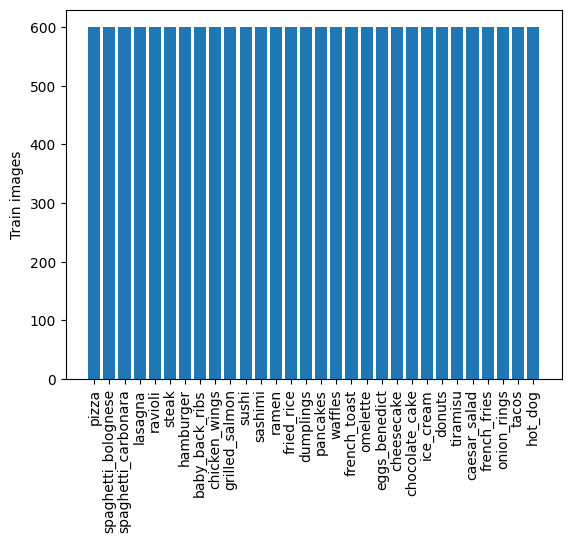

In [ ]:
trainClassCounts = []

for classId in selectedClassesIds:
    count = sum(trainUnparsed._labels[i] == classId for i in trainIndices)
    trainClassCounts.append(count)

plt.bar(range(len(selectedClasses)), trainClassCounts)
plt.xticks(range(len(selectedClasses)), selectedClasses, rotation=90)
plt.ylabel("Train images")
plt.show()

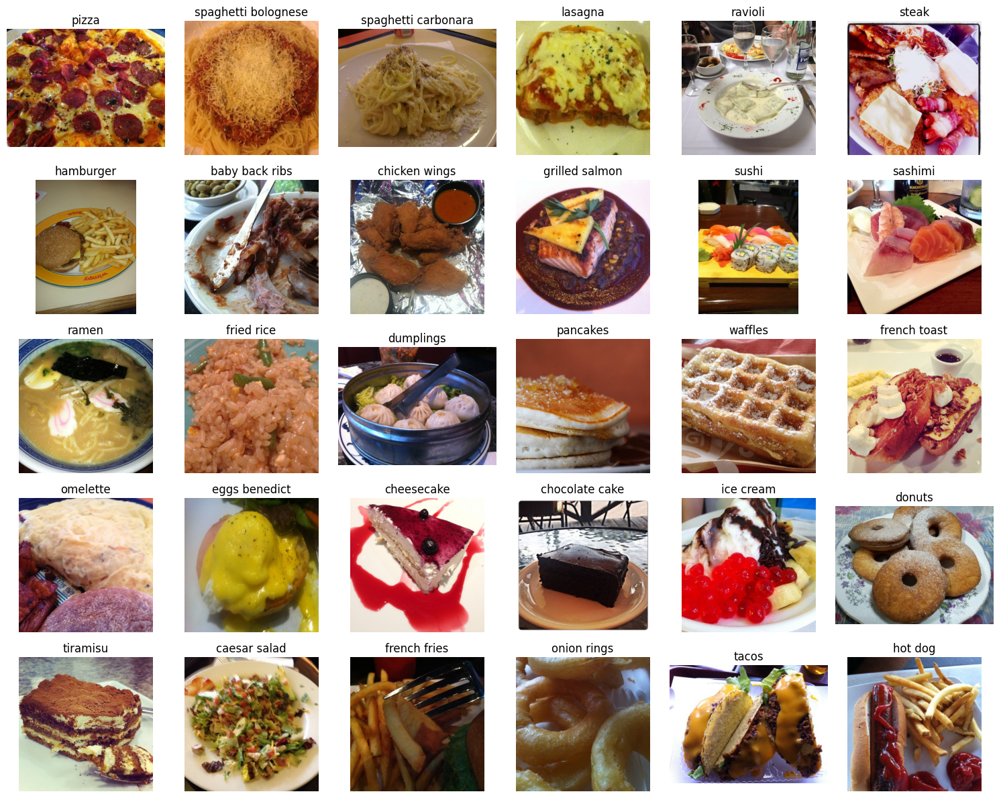

In [ ]:
fig, axes = plt.subplots(5, 6, figsize=(15, 12))

for ax, name in zip(axes.flat, selectedClasses):
    classId = trainUnparsed.class_to_idx[name]

    i = next(i for i in trainIndices if trainUnparsed._labels[i] == classId)

    image, label = trainUnparsed[i]

    ax.imshow(image)
    ax.set_title(name.replace("_", " "))
    ax.axis("off")

plt.tight_layout()
plt.show()

### EDA - razlike izmedju klasa

Primecujem razlike u osvetljenju, velicini hrane u kadru i pozadini.
Neke klase su veoma slicne, npr. sushi/sashimi i waffles/french toast.

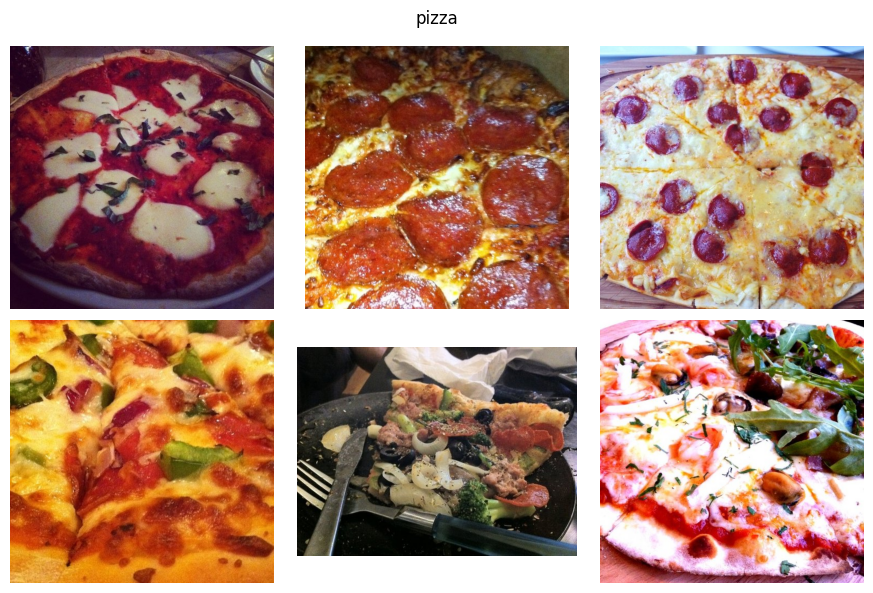

In [ ]:
name = "pizza"
classId = trainUnparsed.class_to_idx[name]

indices = [i for i in trainIndices if trainUnparsed._labels[i] == classId]

fig, axes = plt.subplots(2, 3, figsize=(9, 6))

for ax, i in zip(axes.flat, random.sample(indices, 6)):
    image, _ = trainUnparsed[i]

    ax.imshow(image)
    ax.axis("off")

plt.suptitle(name)
plt.tight_layout()
plt.show()

### Varijacija unutar iste klase

Ista klasa moze izgledati dosta drugacije zbog oblika, ugla, topinga i kadra.
Zato model ne sme da nauci samo jedan tipican izgled hrane.

Isti problem se vidi i kod drugih klasa: hrana se pojavljuje u razlicitim oblicima,
posudama i okruzenjima.

Pored varijacije unutar klase, neke klase su vizuelno veoma slicne.
Ocekujem da ce upravo takvi parovi biti medju najcescim greskama.

### Glavni problemi koje ocekujem

- velika varijacija unutar iste klase
- slicnost izmedju nekih klasa
- razliciti uglovi i velicina hrane u kadru
- razlicito osvetljenje i pozadina

## Preprocessing i augmentacija

Sve slike svodim na `224x224`, sto odgovara ulazu pretrained ResNet modela.
Na train skupu koristim blage random augmentacije, a validation i test ostaju deterministicki.

In [13]:
randomCrop = v2.RandomResizedCrop(size=224, scale=(0.70, 1.0), ratio=(0.90, 1.10), antialias=True)

horizontalFlip = v2.RandomHorizontalFlip(p=0.5)

colorJitter = v2.RandomApply([v2.ColorJitter(brightness=0.15, contrast=0.15, saturation=0.10)], p=0.5)

In [14]:
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

trainTransform = v2.Compose([
    randomCrop,
    horizontalFlip,
    colorJitter,
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=mean, std=std)
])

evalTransform = v2.Compose([
    v2.Resize(256, antialias=True),
    v2.CenterCrop(224),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=mean, std=std)
])

In [15]:
classMapping = {
    trainUnparsed.class_to_idx[name]: i
    for i, name in enumerate(selectedClasses)
}

In [16]:
class FoodSubset(Dataset):
    def __init__(self, subset, transform, classMapping):
        self.subset = subset
        self.transform = transform
        self.classMapping = classMapping

    def __len__(self):
        return len(self.subset)

    def __getitem__(self, i):
        image, label = self.subset[i]
        image = self.transform(image)
        label = self.classMapping[label]
        return image, label

In [17]:
trainData = FoodSubset(trainData, trainTransform, classMapping)
valData = FoodSubset(valData, evalTransform, classMapping)
testData = FoodSubset(testData, evalTransform, classMapping)

batchSize = 64

trainLoader = DataLoader(trainData, batch_size=batchSize, shuffle=True, num_workers=2, pin_memory=True)
valLoader = DataLoader(valData, batch_size=batchSize, shuffle=False, num_workers=2, pin_memory=True)
testLoader = DataLoader(testData, batch_size=batchSize, shuffle=False, num_workers=2, pin_memory=True)

images, labels = next(iter(trainLoader))
print(images.shape, labels.shape)

torch.Size([64, 3, 224, 224]) torch.Size([64])


## Model A1 - baseline

A1 je jednostavan CNN treniran od nule. Koristim ga kao jasan baseline za sve kasnije modele.

In [18]:
class FoodCNN(nn.Module):
    def __init__(self, numClasses):
        super().__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )

        self.pool = nn.AdaptiveAvgPool2d((1, 1))

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(0.3),
            nn.Linear(256, numClasses)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.pool(x)
        x = self.classifier(x)
        return x

## Model A2 - improved CNN

A2 je dublji CNN sa BatchNorm slojevima.
Ovde proveravam koliko dobijam samo boljom arhitekturom, bez pretrained tezina.

In [19]:
class FoodCNN2(nn.Module):
    def __init__(self, numClasses):
        super().__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),

            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),

            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )

        self.pool = nn.AdaptiveAvgPool2d((1, 1))

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(0.3),
            nn.Linear(256, numClasses)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.pool(x)
        x = self.classifier(x)
        return x

### Zasto scheduler i early stopping?

`ReduceLROnPlateau` smanjuje learning rate kada validation loss prestane da napreduje.
Early stopping prekida trening posle 5 epoha bez poboljsanja, da ne trosim compute kada model vise ne napreduje.

## Training

Za sve modele pratim train i validation loss/accuracy.
Checkpoint cuvam kada validation rezultat napreduje.

In [20]:
def evaluate(model, loader, criterion):
    model.eval()
    totalLoss = 0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            totalLoss += loss.item() * images.size(0)
            correct += (outputs.argmax(1) == labels).sum().item()
            total += labels.size(0)

    return totalLoss / total, correct / total

In [21]:
def trainModel(model, name, maxEpochs=30, lr=0.001):
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", factor=0.5, patience=2)

    history = {
        "trainLoss": [], "trainAcc": [],
        "valLoss": [], "valAcc": [], "lr": []
    }

    bestValLoss = float("inf")
    badEpochs = 0

    for epoch in range(maxEpochs):
        model.train()
        totalLoss = 0
        correct = 0
        total = 0

        for images, labels in trainLoader:
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            totalLoss += loss.item() * images.size(0)
            correct += (outputs.argmax(1) == labels).sum().item()
            total += labels.size(0)

        trainLoss = totalLoss / total
        trainAcc = correct / total
        valLoss, valAcc = evaluate(model, valLoader, criterion)

        scheduler.step(valLoss)
        currentLR = optimizer.param_groups[0]["lr"]

        history["trainLoss"].append(trainLoss)
        history["trainAcc"].append(trainAcc)
        history["valLoss"].append(valLoss)
        history["valAcc"].append(valAcc)
        history["lr"].append(currentLR)

        improved = valLoss < bestValLoss

        if improved:
            bestValLoss = valLoss
            badEpochs = 0
        else:
            badEpochs += 1

        checkpoint = {
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "scheduler_state_dict": scheduler.state_dict(),
            "epoch": epoch + 1,
            "best_val_loss": bestValLoss,
            "history": history,
            "classes": selectedClasses
        }

        torch.save(checkpoint, name + "_last.pth")

        if improved:
            torch.save(checkpoint, name + "_best.pth")

        print(
            f"epoch {epoch + 1:02d} | "
            f"train {trainLoss:.4f} {trainAcc:.3f} | "
            f"val {valLoss:.4f} {valAcc:.3f} | "
            f"lr {currentLR:.1e}"
        )

        if badEpochs >= 5:
            print("early stopping")
            break

    return history

### Train A1

A1 treniram kao osnovni rezultat sa kojim poredim ostale modele.

In [ ]:
modelA1 = FoodCNN(len(selectedClasses)).to(device)

if os.path.exists("modelA1_last.pth"):
    historyA1 = torch.load("modelA1_last.pth", map_location="cpu", weights_only=False)["history"]
    print("A1 loaded")
else:
    historyA1 = trainModel(modelA1, "modelA1")

A1 loaded


### Train A2

A2 koristi isti dataset i isti trening pipeline, tako da promena rezultata dolazi pre svega od arhitekture.

In [ ]:
modelA2 = FoodCNN2(len(selectedClasses)).to(device)

if os.path.exists("modelA2_last.pth"):
    historyA2 = torch.load("modelA2_last.pth", map_location="cpu", weights_only=False)["history"]
    print("A2 loaded")
else:
    historyA2 = trainModel(modelA2, "modelA2")

epoch 01 | train 3.0215 0.148 | val 2.9288 0.172 | lr 1.0e-03
epoch 02 | train 2.7514 0.217 | val 2.5870 0.262 | lr 1.0e-03
epoch 03 | train 2.5311 0.272 | val 2.9446 0.230 | lr 1.0e-03
epoch 04 | train 2.3522 0.322 | val 2.6172 0.266 | lr 1.0e-03
epoch 05 | train 2.2173 0.359 | val 2.3608 0.312 | lr 1.0e-03
epoch 06 | train 2.0901 0.391 | val 2.2507 0.350 | lr 1.0e-03
epoch 07 | train 1.9971 0.420 | val 2.1430 0.374 | lr 1.0e-03
epoch 08 | train 1.8972 0.448 | val 1.9709 0.430 | lr 1.0e-03
epoch 09 | train 1.8110 0.474 | val 2.0914 0.401 | lr 1.0e-03
epoch 10 | train 1.7278 0.499 | val 2.2364 0.363 | lr 1.0e-03
epoch 11 | train 1.6668 0.517 | val 2.0734 0.416 | lr 5.0e-04
epoch 12 | train 1.4993 0.567 | val 1.5768 0.542 | lr 5.0e-04
epoch 13 | train 1.4490 0.578 | val 1.5291 0.569 | lr 5.0e-04
epoch 14 | train 1.4226 0.584 | val 1.5219 0.564 | lr 5.0e-04
epoch 15 | train 1.3770 0.597 | val 1.5536 0.554 | lr 5.0e-04
epoch 16 | train 1.3499 0.606 | val 1.4890 0.566 | lr 5.0e-04
epoch 17

## A1 / A2 rezultati

Pored accuracy gledam i macro F1, krive treninga i klase na kojima model najvise gresi.

In [ ]:
checkpointA1 = torch.load("modelA1_best.pth", map_location=device, weights_only=False)
checkpointA2 = torch.load("modelA2_best.pth", map_location=device, weights_only=False)

modelA1 = FoodCNN(len(selectedClasses)).to(device)
modelA2 = FoodCNN2(len(selectedClasses)).to(device)

modelA1.load_state_dict(checkpointA1["model_state_dict"])
modelA2.load_state_dict(checkpointA2["model_state_dict"])

historyA1 = torch.load("modelA1_last.pth", map_location="cpu", weights_only=False)["history"]
historyA2 = torch.load("modelA2_last.pth", map_location="cpu", weights_only=False)["history"]

print("A1 best epoch:", checkpointA1["epoch"], "| val loss:", round(checkpointA1["best_val_loss"], 4))
print("A2 best epoch:", checkpointA2["epoch"], "| val loss:", round(checkpointA2["best_val_loss"], 4))

A1 best epoch: 30 | val loss: 1.6948
A2 best epoch: 27 | val loss: 1.1438


In [ ]:
paramsA1 = sum(p.numel() for p in modelA1.parameters())
paramsA2 = sum(p.numel() for p in modelA2.parameters())

print("A1 params:", paramsA1)
print("A2 params:", paramsA2)

A1 params: 396126
A2 params: 1135518


In [22]:
def plotHistory(history, name):
    plt.plot(history["trainLoss"], label="train")
    plt.plot(history["valLoss"], label="validation")
    plt.title(name + " loss")
    plt.xlabel("Epoch")
    plt.legend()
    plt.show()

    plt.plot(history["trainAcc"], label="train")
    plt.plot(history["valAcc"], label="validation")
    plt.title(name + " accuracy")
    plt.xlabel("Epoch")
    plt.legend()
    plt.show()

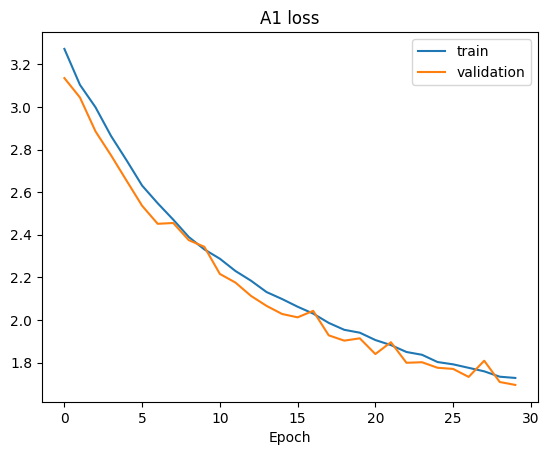

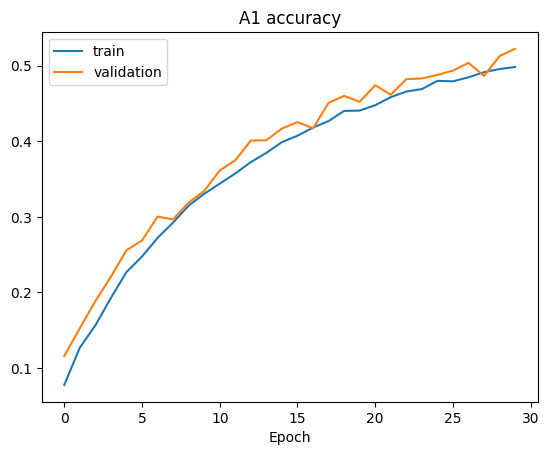

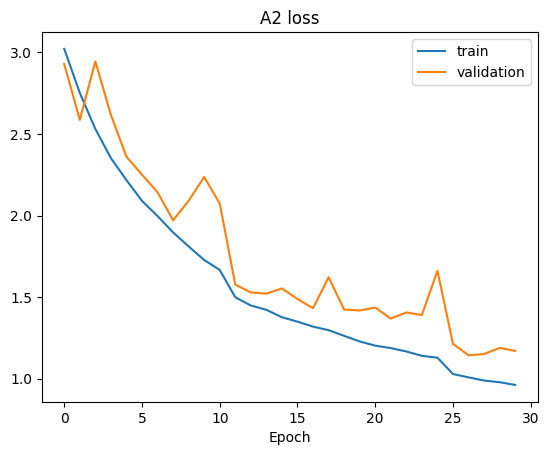

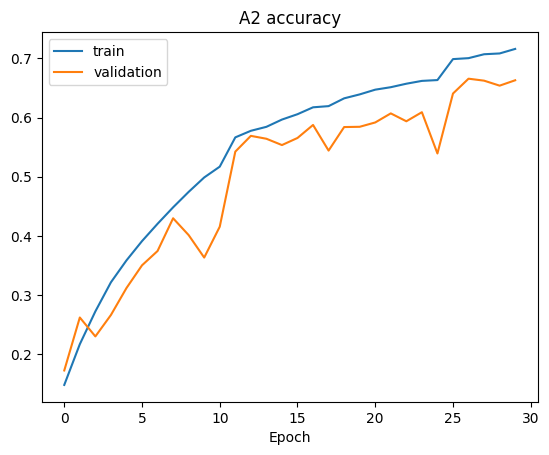

In [ ]:
plotHistory(historyA1, "A1")
plotHistory(historyA2, "A2")

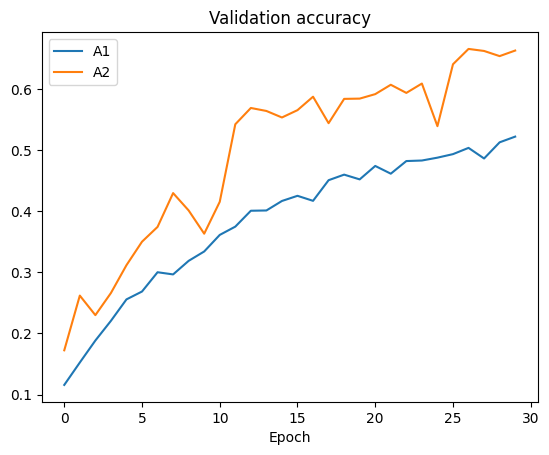

In [ ]:
plt.plot(historyA1["valAcc"], label="A1")
plt.plot(historyA2["valAcc"], label="A2")
plt.title("Validation accuracy")
plt.xlabel("Epoch")
plt.legend()
plt.show()

In [23]:
def getPredictions(model, loader):
    trueLabels = []
    predictions = []

    model.eval()

    with torch.no_grad():
        for images, labels in loader:
            outputs = model(images.to(device))
            predictions.extend(outputs.argmax(1).cpu().tolist())
            trueLabels.extend(labels.tolist())

    return trueLabels, predictions

In [ ]:
trueA1, predA1 = getPredictions(modelA1, valLoader)
trueA2, predA2 = getPredictions(modelA2, valLoader)

print(f"A1 | accuracy {accuracy_score(trueA1, predA1):.3f} | macro F1 {f1_score(trueA1, predA1, average='macro'):.3f}")
print(f"A2 | accuracy {accuracy_score(trueA2, predA2):.3f} | macro F1 {f1_score(trueA2, predA2, average='macro'):.3f}")

In [ ]:
print(classification_report(trueA2, predA2, target_names=selectedClasses, digits=3))

                     precision    recall  f1-score   support

              pizza      0.569     0.827     0.674       150
spaghetti_bolognese      0.771     0.807     0.788       150
spaghetti_carbonara      0.896     0.687     0.777       150
            lasagna      0.576     0.553     0.565       150
            ravioli      0.680     0.553     0.610       150
              steak      0.514     0.487     0.500       150
          hamburger      0.631     0.593     0.612       150
     baby_back_ribs      0.601     0.713     0.652       150
      chicken_wings      0.752     0.667     0.707       150
     grilled_salmon      0.682     0.487     0.568       150
              sushi      0.718     0.680     0.699       150
            sashimi      0.880     0.733     0.800       150
              ramen      0.867     0.653     0.745       150
         fried_rice      0.850     0.753     0.799       150
          dumplings      0.797     0.733     0.764       150
           pancakes    

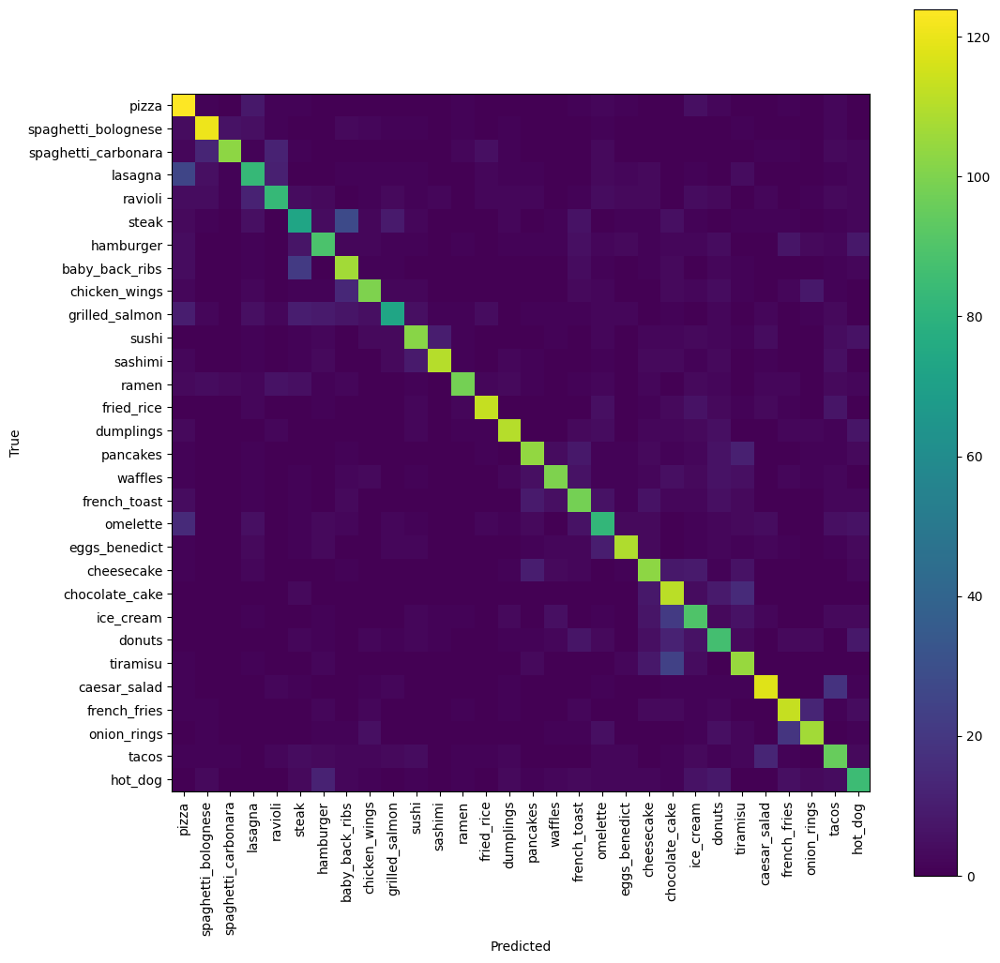

In [ ]:
cm = confusion_matrix(trueA2, predA2)

plt.figure(figsize=(12, 12))
plt.imshow(cm)
plt.xticks(range(len(selectedClasses)), selectedClasses, rotation=90)
plt.yticks(range(len(selectedClasses)), selectedClasses)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.colorbar()
plt.show()

In [ ]:
mistakes = []

for trueClass in range(len(selectedClasses)):
    for predictedClass in range(len(selectedClasses)):
        if trueClass != predictedClass:
            mistakes.append((
                cm[trueClass, predictedClass],
                selectedClasses[trueClass],
                selectedClasses[predictedClass]
            ))

mistakes.sort(reverse=True)

for count, trueClass, predictedClass in mistakes[:10]:
    print(f"{trueClass} -> {predictedClass}: {count}")

steak -> baby_back_ribs: 28
lasagna -> pizza: 26
tiramisu -> chocolate_cake: 24
ice_cream -> chocolate_cake: 21
baby_back_ribs -> steak: 21
onion_rings -> french_fries: 19
caesar_salad -> tacos: 18
omelette -> pizza: 15
chocolate_cake -> tiramisu: 15
chicken_wings -> baby_back_ribs: 14


## Model B - transfer learning

Sledece prelazim na pretrained ResNet18.

B1 koristi feature extraction, a B2 partial fine-tuning.

In [ ]:
weights = ResNet18_Weights.DEFAULT
modelB1 = resnet18(weights=weights)

for p in modelB1.parameters():
    p.requires_grad = False

modelB1.fc = nn.Linear(modelB1.fc.in_features, len(selectedClasses))
modelB1 = modelB1.to(device)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 132MB/s]


In [ ]:
for name, p in modelB1.named_parameters():
    if p.requires_grad:
        print(name)

fc.weight
fc.bias


In [ ]:
if os.path.exists("modelB1_last.pth"):
    historyB1 = torch.load("modelB1_last.pth", map_location="cpu", weights_only=False)["history"]
    print("B1 loaded")
else:
    historyB1 = trainModel(modelB1, "modelB1", maxEpochs=20, lr=0.001)

epoch 01 | train 2.0746 0.468 | val 1.4877 0.612 | lr 1.0e-03
epoch 02 | train 1.3678 0.625 | val 1.3280 0.636 | lr 1.0e-03
epoch 03 | train 1.2231 0.656 | val 1.2545 0.642 | lr 1.0e-03
epoch 04 | train 1.1620 0.667 | val 1.2461 0.652 | lr 1.0e-03
epoch 05 | train 1.1208 0.675 | val 1.2192 0.652 | lr 1.0e-03
epoch 06 | train 1.0881 0.681 | val 1.2223 0.653 | lr 1.0e-03
epoch 07 | train 1.0614 0.690 | val 1.1929 0.656 | lr 1.0e-03
epoch 08 | train 1.0487 0.696 | val 1.2217 0.648 | lr 1.0e-03
epoch 09 | train 1.0238 0.696 | val 1.1970 0.656 | lr 1.0e-03
epoch 10 | train 1.0256 0.700 | val 1.1915 0.660 | lr 1.0e-03
epoch 11 | train 1.0052 0.705 | val 1.1886 0.659 | lr 1.0e-03
epoch 12 | train 0.9980 0.702 | val 1.1804 0.663 | lr 1.0e-03
epoch 13 | train 0.9891 0.709 | val 1.1802 0.670 | lr 1.0e-03
epoch 14 | train 0.9787 0.710 | val 1.1915 0.662 | lr 1.0e-03
epoch 15 | train 0.9732 0.708 | val 1.1799 0.672 | lr 1.0e-03
epoch 16 | train 0.9668 0.712 | val 1.2111 0.659 | lr 1.0e-03
epoch 17

### Save trained models

Posle treninga skidam checkpoint-e na racunar da ih ne izgubim sa Colab runtime-om.

In [ ]:
saveModels()

## B1 rezultati

B1 mi pokazuje koliko pretrained ImageNet feature-i rade kada backbone ostane zamrznut.

In [ ]:
checkpointB1 = torch.load("modelB1_best.pth", map_location=device, weights_only=False)

modelB1 = resnet18(weights=None)

for p in modelB1.parameters():
    p.requires_grad = False

modelB1.fc = nn.Linear(modelB1.fc.in_features, len(selectedClasses))
modelB1.load_state_dict(checkpointB1["model_state_dict"])
modelB1 = modelB1.to(device)
modelB1.eval()

historyB1 = torch.load("modelB1_last.pth", map_location="cpu", weights_only=False)["history"]

print("B1 best epoch:", checkpointB1["epoch"], "| val loss:", round(checkpointB1["best_val_loss"], 4))

B1 best epoch: 20 | val loss: 1.17


In [ ]:
trueB1, predB1 = getPredictions(modelB1, valLoader)

print(f"A1 | accuracy {accuracy_score(trueA1, predA1):.3f} | macro F1 {f1_score(trueA1, predA1, average='macro'):.3f}")
print(f"A2 | accuracy {accuracy_score(trueA2, predA2):.3f} | macro F1 {f1_score(trueA2, predA2, average='macro'):.3f}")
print(f"B1 | accuracy {accuracy_score(trueB1, predB1):.3f} | macro F1 {f1_score(trueB1, predB1, average='macro'):.3f}")

A1 | accuracy 0.522 | macro F1 0.520
A2 | accuracy 0.666 | macro F1 0.668
B1 | accuracy 0.672 | macro F1 0.670


In [ ]:
paramsB1 = sum(p.numel() for p in modelB1.parameters())
trainableB1 = sum(p.numel() for p in modelB1.parameters() if p.requires_grad)

print("B1 params:", paramsB1)
print("B1 trainable:", trainableB1)

B1 params: 11191902
B1 trainable: 15390


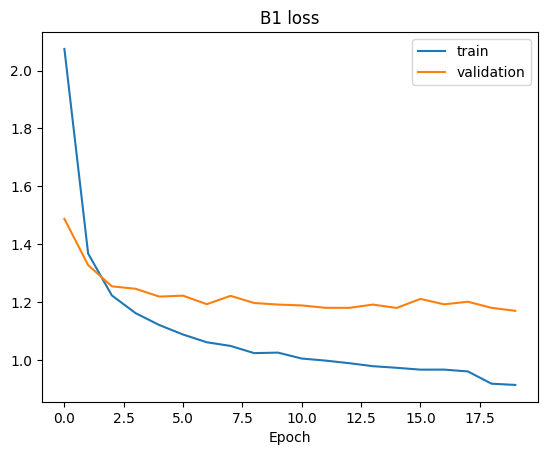

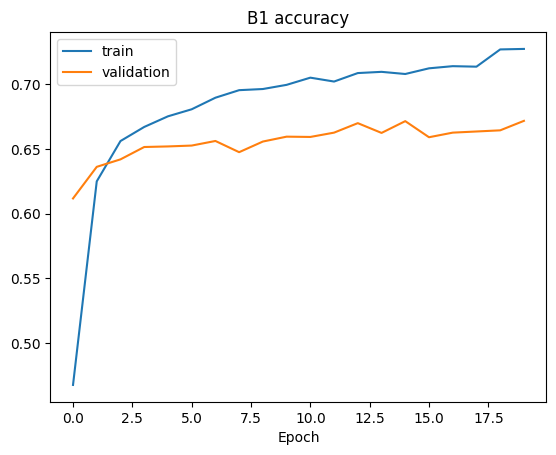

In [ ]:
plotHistory(historyB1, "B1")

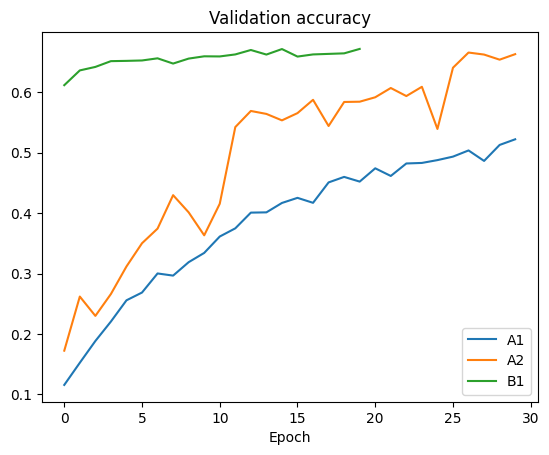

In [ ]:
plt.plot(historyA1["valAcc"], label="A1")
plt.plot(historyA2["valAcc"], label="A2")
plt.plot(historyB1["valAcc"], label="B1")
plt.title("Validation accuracy")
plt.xlabel("Epoch")
plt.legend()
plt.show()

In [ ]:
print(classification_report(trueB1, predB1, target_names=selectedClasses, digits=3))

                     precision    recall  f1-score   support

              pizza      0.748     0.733     0.741       150
spaghetti_bolognese      0.740     0.720     0.730       150
spaghetti_carbonara      0.674     0.813     0.737       150
            lasagna      0.623     0.607     0.615       150
            ravioli      0.506     0.520     0.513       150
              steak      0.643     0.480     0.550       150
          hamburger      0.711     0.673     0.692       150
     baby_back_ribs      0.651     0.633     0.642       150
      chicken_wings      0.669     0.780     0.720       150
     grilled_salmon      0.483     0.480     0.482       150
              sushi      0.586     0.613     0.599       150
            sashimi      0.778     0.793     0.785       150
              ramen      0.792     0.760     0.776       150
         fried_rice      0.723     0.767     0.744       150
          dumplings      0.901     0.727     0.804       150
           pancakes    

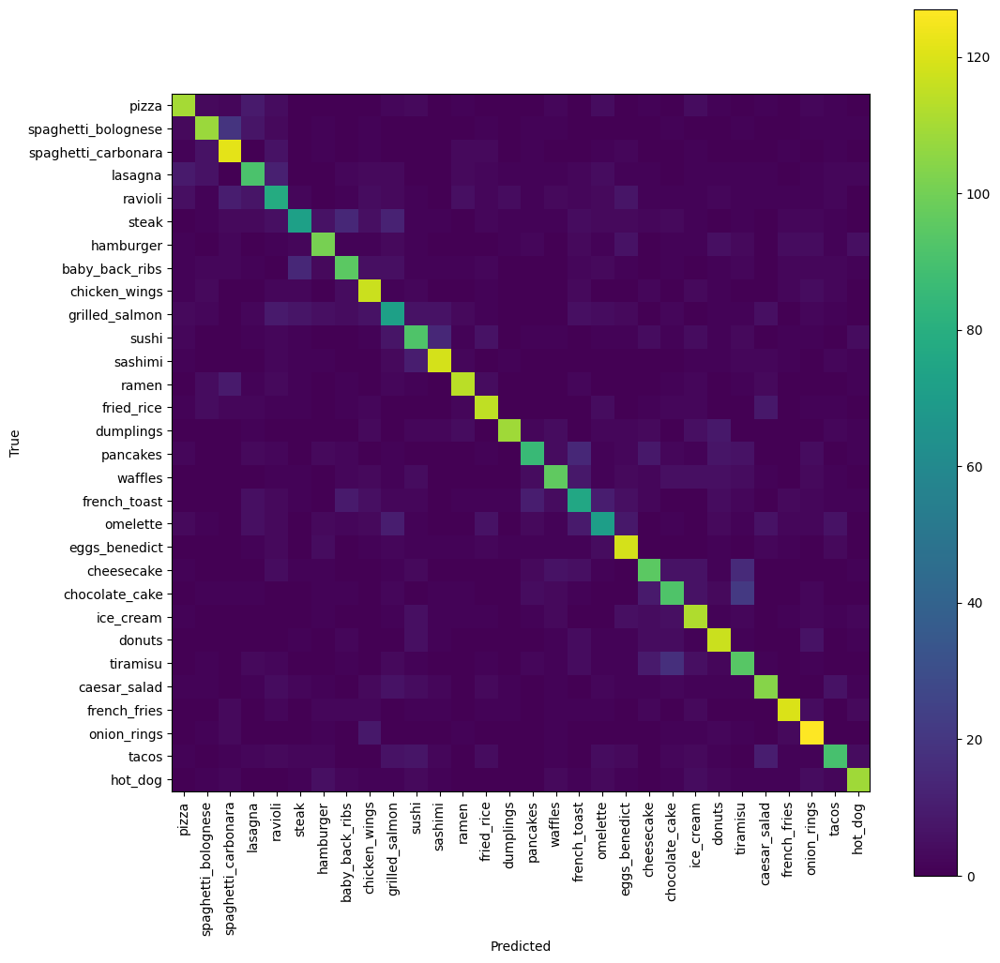

In [ ]:
cmB1 = confusion_matrix(trueB1, predB1)

plt.figure(figsize=(12, 12))
plt.imshow(cmB1)
plt.xticks(range(len(selectedClasses)), selectedClasses, rotation=90)
plt.yticks(range(len(selectedClasses)), selectedClasses)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.colorbar()
plt.show()

In [ ]:
mistakesB1 = []

for trueClass in range(len(selectedClasses)):
    for predictedClass in range(len(selectedClasses)):
        if trueClass != predictedClass:
            mistakesB1.append((
                cmB1[trueClass, predictedClass],
                selectedClasses[trueClass],
                selectedClasses[predictedClass]
            ))

mistakesB1.sort(reverse=True)

for count, trueClass, predictedClass in mistakesB1[:10]:
    print(f"{trueClass} -> {predictedClass}: {count}")

chocolate_cake -> tiramisu: 21
spaghetti_bolognese -> spaghetti_carbonara: 19
tiramisu -> chocolate_cake: 17
cheesecake -> tiramisu: 15
sushi -> sashimi: 14
steak -> baby_back_ribs: 14
pancakes -> french_toast: 14
baby_back_ribs -> steak: 14
steak -> grilled_salmon: 12
lasagna -> ravioli: 11


### Best and worst classes

Gledam per-class F1 da vidim koje klase su sistematski lake ili teske.

In [24]:
def printClassResults(name, trueLabels, predictions):
    report = classification_report(trueLabels, predictions, target_names=selectedClasses, output_dict=True, zero_division=0)

    scores = [(report[className]["f1-score"], className) for className in selectedClasses]
    scores.sort(reverse=True)

    print(name, "best")
    for score, className in scores[:5]:
        print(f"{className}: {score:.3f}")

    print(name, "worst")
    for score, className in scores[-5:][::-1]:
        print(f"{className}: {score:.3f}")

In [ ]:
printClassResults("A1", trueA1, predA1)
print()
printClassResults("A2", trueA2, predA2)
print()
printClassResults("B1", trueB1, predB1)

A1 best
sashimi: 0.671
dumplings: 0.657
spaghetti_carbonara: 0.632
onion_rings: 0.625
fried_rice: 0.618
A1 worst
grilled_salmon: 0.334
donuts: 0.344
omelette: 0.369
hot_dog: 0.384
ravioli: 0.389

A2 best
sashimi: 0.800
fried_rice: 0.799
spaghetti_bolognese: 0.788
spaghetti_carbonara: 0.777
caesar_salad: 0.774
A2 worst
steak: 0.500
donuts: 0.544
omelette: 0.550
hot_dog: 0.559
lasagna: 0.565

B1 best
french_fries: 0.811
dumplings: 0.804
sashimi: 0.785
ramen: 0.776
onion_rings: 0.772
B1 worst
grilled_salmon: 0.482
omelette: 0.507
french_toast: 0.512
ravioli: 0.513
steak: 0.550


### B1 mistakes

Vizuelno proveravam nekoliko pogresnih predikcija, ne samo zbirnu metriku.

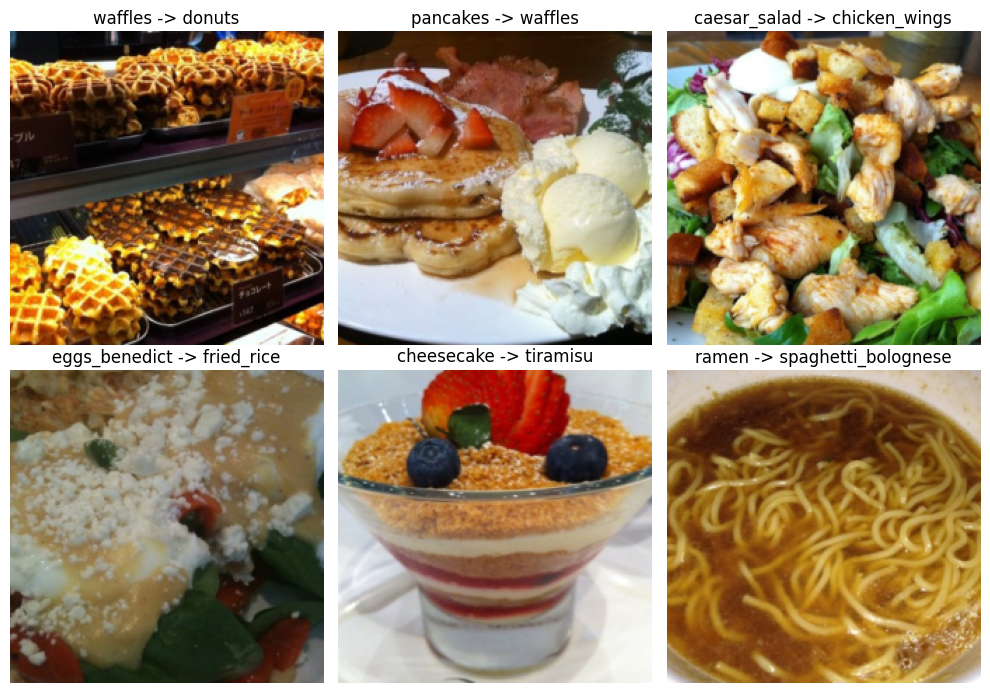

In [ ]:
wrong = np.where(np.array(trueB1) != np.array(predB1))[0][:6]

meanTensor = torch.tensor(mean).view(3, 1, 1)
stdTensor = torch.tensor(std).view(3, 1, 1)

fig, axes = plt.subplots(2, 3, figsize=(10, 7))

for ax, i in zip(axes.flat, wrong):
    image, label = valData[i]
    image = image * stdTensor + meanTensor
    image = image.clamp(0, 1)

    ax.imshow(image.permute(1, 2, 0))
    ax.set_title(f"{selectedClasses[label]} -> {selectedClasses[predB1[i]]}")
    ax.axis("off")

plt.tight_layout()
plt.show()

## Model B2 - partial fine-tuning

B2 krece od najboljeg B1 checkpoint-a.
Odmrzavam samo poslednji ResNet blok (`layer4`) i classifier, da se kasniji feature-i prilagode hrani.

In [ ]:
checkpointB1 = torch.load("modelB1_best.pth", map_location=device, weights_only=False)

modelB2 = resnet18(weights=None)
modelB2.fc = nn.Linear(modelB2.fc.in_features, len(selectedClasses))
modelB2.load_state_dict(checkpointB1["model_state_dict"])

for p in modelB2.parameters():
    p.requires_grad = False

for p in modelB2.layer4.parameters():
    p.requires_grad = True

for p in modelB2.fc.parameters():
    p.requires_grad = True

modelB2 = modelB2.to(device)

In [ ]:
for name, p in modelB2.named_parameters():
    if p.requires_grad:
        print(name)

layer4.0.conv1.weight
layer4.0.bn1.weight
layer4.0.bn1.bias
layer4.0.conv2.weight
layer4.0.bn2.weight
layer4.0.bn2.bias
layer4.0.downsample.0.weight
layer4.0.downsample.1.weight
layer4.0.downsample.1.bias
layer4.1.conv1.weight
layer4.1.bn1.weight
layer4.1.bn1.bias
layer4.1.conv2.weight
layer4.1.bn2.weight
layer4.1.bn2.bias
fc.weight
fc.bias


In [ ]:
if os.path.exists("modelB2_last.pth"):
    historyB2 = torch.load("modelB2_last.pth", map_location="cpu", weights_only=False)["history"]
    print("B2 loaded")
else:
    print("B2 checkpoint missing")

In [ ]:
saveModels()

saved:
modelA1_best.pth
modelA1_last.pth
modelA2_best.pth
modelA2_last.pth
modelB1_best.pth
modelB1_last.pth
modelB2_best.pth
modelB2_last.pth


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## B2 rezultati

B2 poredim sa A1, A2 i B1 na istom validation skupu.

In [ ]:
checkpointB2 = torch.load("modelB2_last.pth", map_location=device, weights_only=False)

modelB2 = resnet18(weights=None)
modelB2.fc = nn.Linear(modelB2.fc.in_features, len(selectedClasses))
modelB2.load_state_dict(checkpointB2["model_state_dict"])
modelB2 = modelB2.to(device)
modelB2.eval()

historyB2 = checkpointB2["history"]

print("B2 selected epoch:", checkpointB2["epoch"])
print("B2 validation accuracy:", max(historyB2["valAcc"]))

In [ ]:
paramsB2 = sum(p.numel() for p in modelB2.parameters())
trainableB2 = sum(p.numel() for p in modelB2.parameters() if p.requires_grad)

print("B2 params:", paramsB2)
print("B2 trainable:", trainableB2)

B2 params: 11191902
B2 trainable: 8409118


In [ ]:
plotHistory(historyB2, "B2")

In [ ]:
checkpointA1 = torch.load("modelA1_best.pth", map_location=device, weights_only=False)
checkpointA2 = torch.load("modelA2_best.pth", map_location=device, weights_only=False)
checkpointB1 = torch.load("modelB1_best.pth", map_location=device, weights_only=False)

modelA1 = FoodCNN(len(selectedClasses)).to(device)
modelA2 = FoodCNN2(len(selectedClasses)).to(device)

modelB1 = resnet18(weights=None)
modelB1.fc = nn.Linear(modelB1.fc.in_features, len(selectedClasses))
modelB1 = modelB1.to(device)

modelA1.load_state_dict(checkpointA1["model_state_dict"])
modelA2.load_state_dict(checkpointA2["model_state_dict"])
modelB1.load_state_dict(checkpointB1["model_state_dict"])

modelA1.eval()
modelA2.eval()
modelB1.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
trueA1, predA1 = getPredictions(modelA1, valLoader)
trueA2, predA2 = getPredictions(modelA2, valLoader)
trueB1, predB1 = getPredictions(modelB1, valLoader)
trueB2, predB2 = getPredictions(modelB2, valLoader)

In [ ]:
trueB2, predB2 = getPredictions(modelB2, valLoader)

print(f"A1 | accuracy {accuracy_score(trueA1, predA1):.3f} | macro F1 {f1_score(trueA1, predA1, average='macro'):.3f}")
print(f"A2 | accuracy {accuracy_score(trueA2, predA2):.3f} | macro F1 {f1_score(trueA2, predA2, average='macro'):.3f}")
print(f"B1 | accuracy {accuracy_score(trueB1, predB1):.3f} | macro F1 {f1_score(trueB1, predB1, average='macro'):.3f}")
print(f"B2 | accuracy {accuracy_score(trueB2, predB2):.3f} | macro F1 {f1_score(trueB2, predB2, average='macro'):.3f}")

A1 | accuracy 0.522 | macro F1 0.520
A2 | accuracy 0.666 | macro F1 0.668
B1 | accuracy 0.672 | macro F1 0.670
B2 | accuracy 0.762 | macro F1 0.762


In [ ]:
historyA1 = torch.load("modelA1_last.pth", map_location="cpu", weights_only=False)["history"]
historyA2 = torch.load("modelA2_last.pth", map_location="cpu", weights_only=False)["history"]
historyB1 = torch.load("modelB1_last.pth", map_location="cpu", weights_only=False)["history"]
historyB2 = torch.load("modelB2_last.pth", map_location="cpu", weights_only=False)["history"]

print(len(historyA1["valAcc"]))
print(len(historyA2["valAcc"]))
print(len(historyB1["valAcc"]))
print(len(historyB2["valAcc"]))

30
30
20
7


### Validation comparison

Ovde me najvise zanima da li fine-tuning stvarno poboljsava generalizaciju,
a ne samo train accuracy.

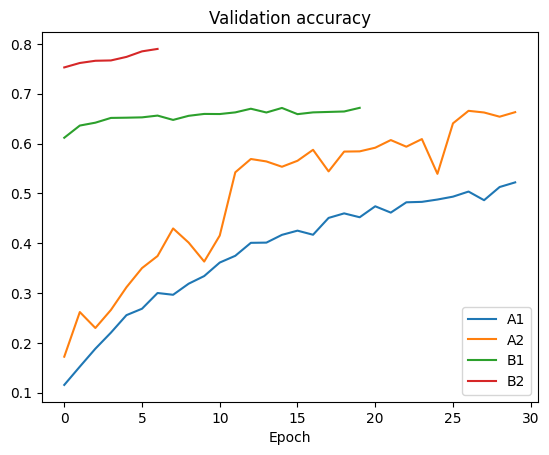

In [ ]:
plt.plot(historyA1["valAcc"], label="A1")
plt.plot(historyA2["valAcc"], label="A2")
plt.plot(historyB1["valAcc"], label="B1")
plt.plot(historyB2["valAcc"], label="B2")
plt.title("Validation accuracy")
plt.xlabel("Epoch")
plt.legend()
plt.show()

In [ ]:
trainedA1 = sum(p.numel() for p in modelA1.parameters())
trainedA2 = sum(p.numel() for p in modelA2.parameters())
trainedB1 = sum(p.numel() for p in modelB1.fc.parameters())
trainedB2 = sum(p.numel() for p in modelB2.layer4.parameters()) + sum(p.numel() for p in modelB2.fc.parameters())

print("A1 trained:", trainedA1)
print("A2 trained:", trainedA2)
print("B1 trained:", trainedB1)
print("B2 trained:", trainedB2)

In [ ]:
print(classification_report(trueB2, predB2, target_names=selectedClasses, digits=3))

                     precision    recall  f1-score   support

              pizza      0.810     0.767     0.788       150
spaghetti_bolognese      0.819     0.873     0.845       150
spaghetti_carbonara      0.808     0.787     0.797       150
            lasagna      0.669     0.753     0.708       150
            ravioli      0.742     0.613     0.672       150
              steak      0.651     0.547     0.594       150
          hamburger      0.800     0.720     0.758       150
     baby_back_ribs      0.642     0.827     0.723       150
      chicken_wings      0.774     0.867     0.818       150
     grilled_salmon      0.683     0.647     0.664       150
              sushi      0.692     0.733     0.712       150
            sashimi      0.761     0.807     0.783       150
              ramen      0.892     0.773     0.829       150
         fried_rice      0.819     0.813     0.816       150
          dumplings      0.902     0.793     0.844       150
           pancakes    

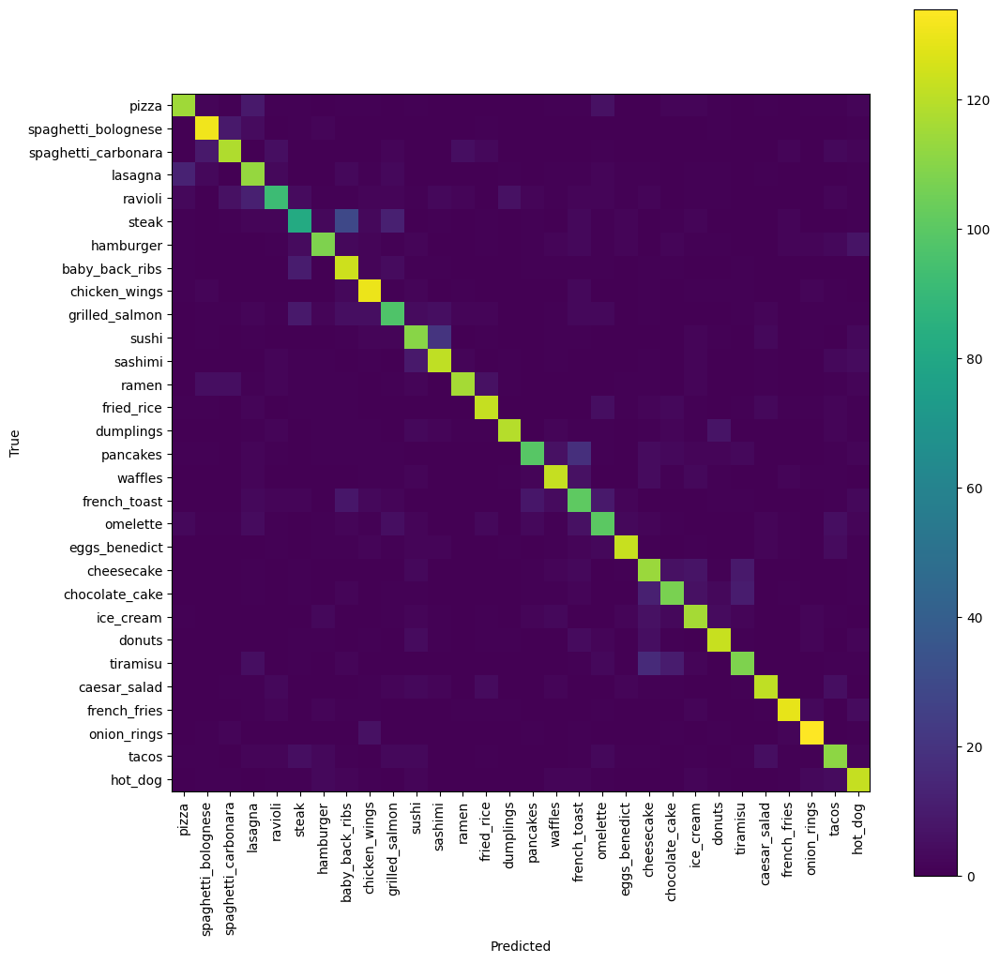

In [ ]:
cmB2 = confusion_matrix(trueB2, predB2)

plt.figure(figsize=(12, 12))
plt.imshow(cmB2)
plt.xticks(range(len(selectedClasses)), selectedClasses, rotation=90)
plt.yticks(range(len(selectedClasses)), selectedClasses)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.colorbar()
plt.show()

In [ ]:
mistakesB2 = []

for trueClass in range(len(selectedClasses)):
    for predictedClass in range(len(selectedClasses)):
        if trueClass != predictedClass:
            mistakesB2.append((
                cmB2[trueClass, predictedClass],
                selectedClasses[trueClass],
                selectedClasses[predictedClass]
            ))

mistakesB2.sort(reverse=True)

for count, trueClass, predictedClass in mistakesB2[:10]:
    print(f"{trueClass} -> {predictedClass}: {count}")

steak -> baby_back_ribs: 29
sushi -> sashimi: 20
pancakes -> french_toast: 18
tiramisu -> cheesecake: 16
lasagna -> pizza: 13
steak -> grilled_salmon: 12
ravioli -> lasagna: 12
chocolate_cake -> cheesecake: 12
tiramisu -> chocolate_cake: 10
chocolate_cake -> tiramisu: 10


In [ ]:
printClassResults("B2", trueB2, predB2)

B2 best
onion_rings: 0.882
french_fries: 0.875
spaghetti_bolognese: 0.845
dumplings: 0.844
eggs_benedict: 0.842
B2 worst
steak: 0.594
french_toast: 0.639
grilled_salmon: 0.664
ravioli: 0.672
omelette: 0.676


## Final validation comparison

Model biram na validation skupu. Test jos ne koristim.

In [ ]:
accA1 = accuracy_score(trueA1, predA1)
accA2 = accuracy_score(trueA2, predA2)
accB1 = accuracy_score(trueB1, predB1)
accB2 = accuracy_score(trueB2, predB2)

f1A1 = f1_score(trueA1, predA1, average="macro")
f1A2 = f1_score(trueA2, predA2, average="macro")
f1B1 = f1_score(trueB1, predB1, average="macro")
f1B2 = f1_score(trueB2, predB2, average="macro")

print(f"A1 | loss {checkpointA1['best_val_loss']:.4f} | acc {accA1:.3f} | F1 {f1A1:.3f}")
print(f"A2 | loss {checkpointA2['best_val_loss']:.4f} | acc {accA2:.3f} | F1 {f1A2:.3f}")
print(f"B1 | loss {checkpointB1['best_val_loss']:.4f} | acc {accB1:.3f} | F1 {f1B1:.3f}")
print(f"B2 | loss {checkpointB2['best_val_loss']:.4f} | acc {accB2:.3f} | F1 {f1B2:.3f}")

A1 | loss 1.6948 | acc 0.522 | F1 0.520
A2 | loss 1.1438 | acc 0.666 | F1 0.668
B1 | loss 1.1700 | acc 0.672 | F1 0.670
B2 | loss 0.8885 | acc 0.762 | F1 0.762


In [ ]:
results = [
    ("A1", accA1, f1A1),
    ("A2", accA2, f1A2),
    ("B1", accB1, f1B1),
    ("B2", accB2, f1B2)
]

results.sort(key=lambda x: x[1], reverse=True)

print("best validation model:", results[0][0])

best validation model: B2


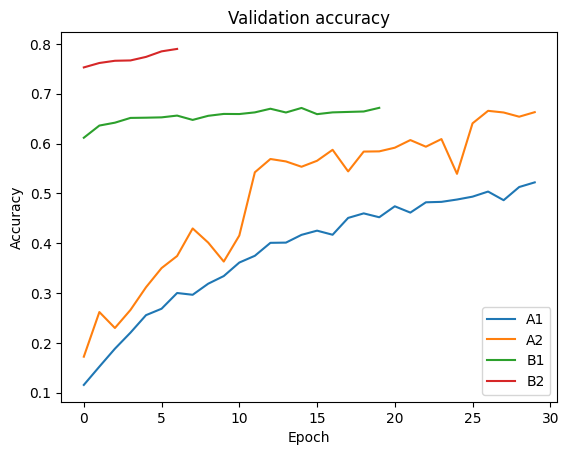

In [ ]:
plt.plot(historyA1["valAcc"], label="A1")
plt.plot(historyA2["valAcc"], label="A2")
plt.plot(historyB1["valAcc"], label="B1")
plt.plot(historyB2["valAcc"], label="B2")

plt.title("Validation accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

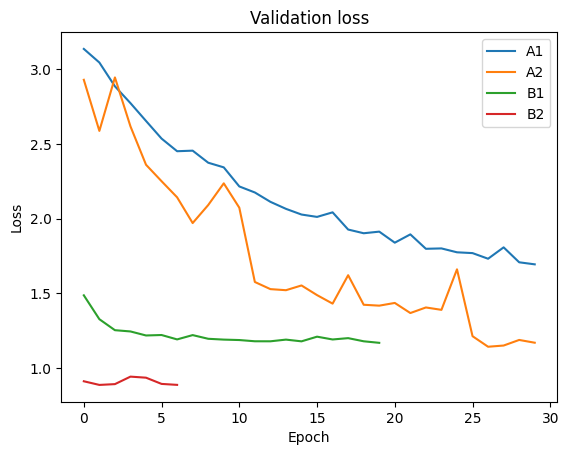

In [ ]:
plt.plot(historyA1["valLoss"], label="A1")
plt.plot(historyA2["valLoss"], label="A2")
plt.plot(historyB1["valLoss"], label="B1")
plt.plot(historyB2["valLoss"], label="B2")

plt.title("Validation loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [ ]:
print("A1 params:", sum(p.numel() for p in modelA1.parameters()))
print("A2 params:", sum(p.numel() for p in modelA2.parameters()))
print("B1 params:", sum(p.numel() for p in modelB1.parameters()))
print("B2 params:", sum(p.numel() for p in modelB2.parameters()))

print()
print("A1 trainable:", sum(p.numel() for p in modelA1.parameters() if p.requires_grad))
print("A2 trainable:", sum(p.numel() for p in modelA2.parameters() if p.requires_grad))
print("B1 trainable:", sum(p.numel() for p in modelB1.parameters() if p.requires_grad))
print("B2 trainable:", sum(p.numel() for p in modelB2.parameters() if p.requires_grad))

A1 params: 396126
A2 params: 1135518
B1 params: 11191902
B2 params: 11191902

A1 trainable: 396126
A2 trainable: 1135518
B1 trainable: 11191902
B2 trainable: 8409118


### Sta svako poredjenje govori

- A1 vs A2: efekat bolje CNN arhitekture od nule
- A2 vs B1: scratch CNN naspram pretrained feature extraction-a
- B1 vs B2: feature extraction naspram partial fine-tuning-a

## Model B3 - regularized fine-tuning

B2 je veoma brzo dostigao visoku train accuracy, pa sam probala konzervativniji fine-tuning:
AdamW, weight decay, label smoothing i manji learning rate za pretrained `layer4`.

Ovde early stopping ceka 7 losih epoha, a `minDelta` ignorise veoma mala poboljsanja.

In [ ]:
checkpointB1 = torch.load("modelB1_best.pth", map_location=device, weights_only=False)

modelB3 = resnet18(weights=None)
modelB3.fc = nn.Linear(modelB3.fc.in_features, len(selectedClasses))
modelB3.load_state_dict(checkpointB1["model_state_dict"])

for p in modelB3.parameters():
    p.requires_grad = False

for p in modelB3.layer4.parameters():
    p.requires_grad = True

for p in modelB3.fc.parameters():
    p.requires_grad = True

modelB3 = modelB3.to(device)

In [ ]:
print("trainable:", sum(p.numel() for p in modelB3.parameters() if p.requires_grad))

trainable: 8409118


In [ ]:
def trainModelB3(model, name, maxEpochs=20):
    criterion = nn.CrossEntropyLoss(label_smoothing=0.1)

    optimizer = torch.optim.AdamW([
        {"params": model.layer4.parameters(), "lr": 1e-5},
        {"params": model.fc.parameters(), "lr": 1e-4}
    ], weight_decay=1e-4)

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="min", factor=0.5, patience=2
    )

    history = {
        "trainLoss": [], "trainAcc": [],
        "valLoss": [], "valAcc": [], "lr": []
    }

    bestValLoss = float("inf")
    minDelta = 0.001
    badEpochs = 0

    for epoch in range(maxEpochs):
        model.eval()
        model.layer4.train()
        model.fc.train()

        totalLoss = 0
        correct = 0
        total = 0

        for images, labels in trainLoader:
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()

            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

            totalLoss += loss.item() * images.size(0)
            correct += (outputs.argmax(1) == labels).sum().item()
            total += labels.size(0)

        trainLoss = totalLoss / total
        trainAcc = correct / total
        valLoss, valAcc = evaluate(model, valLoader, criterion)

        scheduler.step(valLoss)
        currentLR = optimizer.param_groups[0]["lr"]

        history["trainLoss"].append(trainLoss)
        history["trainAcc"].append(trainAcc)
        history["valLoss"].append(valLoss)
        history["valAcc"].append(valAcc)
        history["lr"].append(currentLR)

        improved = valLoss < bestValLoss - minDelta

        if improved:
            bestValLoss = valLoss
            badEpochs = 0
        else:
            badEpochs += 1

        checkpoint = {
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "scheduler_state_dict": scheduler.state_dict(),
            "epoch": epoch + 1,
            "best_val_loss": bestValLoss,
            "history": history,
            "classes": selectedClasses
        }

        torch.save(checkpoint, name + "_last.pth")

        if improved:
            torch.save(checkpoint, name + "_best.pth")

        print(
            f"epoch {epoch + 1:02d} | "
            f"train {trainLoss:.4f} {trainAcc:.3f} | "
            f"val {valLoss:.4f} {valAcc:.3f} | "
            f"lr {currentLR:.1e}"
        )

        if badEpochs >= 7:
            print("early stopping")
            break

    return history

In [ ]:
if os.path.exists("modelB3_last.pth"):
    historyB3 = torch.load("modelB3_last.pth", map_location="cpu", weights_only=False)["history"]
    print("B3 loaded")
else:
    historyB3 = trainModelB3(modelB3, "modelB3")

epoch 01 | train 1.5650 0.736 | val 1.7575 0.676 | lr 1.0e-05
epoch 02 | train 1.4620 0.759 | val 1.7056 0.687 | lr 1.0e-05
epoch 03 | train 1.3927 0.781 | val 1.6656 0.691 | lr 1.0e-05
epoch 04 | train 1.3381 0.804 | val 1.6359 0.698 | lr 1.0e-05
epoch 05 | train 1.2902 0.823 | val 1.6159 0.708 | lr 1.0e-05
epoch 06 | train 1.2512 0.836 | val 1.5983 0.708 | lr 1.0e-05
epoch 07 | train 1.2079 0.851 | val 1.5768 0.716 | lr 1.0e-05
epoch 08 | train 1.1769 0.867 | val 1.5618 0.720 | lr 1.0e-05
epoch 09 | train 1.1518 0.879 | val 1.5527 0.727 | lr 1.0e-05
epoch 10 | train 1.1205 0.890 | val 1.5481 0.730 | lr 1.0e-05
epoch 11 | train 1.1010 0.899 | val 1.5364 0.732 | lr 1.0e-05
epoch 12 | train 1.0738 0.911 | val 1.5293 0.735 | lr 1.0e-05
epoch 13 | train 1.0573 0.919 | val 1.5211 0.733 | lr 1.0e-05
epoch 14 | train 1.0337 0.926 | val 1.5140 0.738 | lr 1.0e-05
epoch 15 | train 1.0169 0.935 | val 1.5081 0.741 | lr 1.0e-05
epoch 16 | train 0.9957 0.942 | val 1.5066 0.744 | lr 1.0e-05
epoch 17

In [ ]:
saveModels()

saved:
modelA1_best.pth
modelA1_last.pth
modelA2_best.pth
modelA2_last.pth
modelB1_best.pth
modelB1_last.pth
modelB2_best.pth
modelB2_last.pth
modelB3_best.pth
modelB3_last.pth


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## B3 rezultati

B3 proverava da li dodatna regularizacija pomaze istom ResNet18 fine-tuning pristupu.

In [ ]:
checkpointB3 = torch.load("modelB3_best.pth", map_location=device, weights_only=False)

modelB3 = resnet18(weights=None)
modelB3.fc = nn.Linear(modelB3.fc.in_features, len(selectedClasses))
modelB3.load_state_dict(checkpointB3["model_state_dict"])
modelB3 = modelB3.to(device)
modelB3.eval()

historyB3 = torch.load("modelB3_last.pth", map_location="cpu", weights_only=False)["history"]

print("B3 best epoch:", checkpointB3["epoch"], "| val loss:", round(checkpointB3["best_val_loss"], 4))

B3 best epoch: 19 | val loss: 1.49


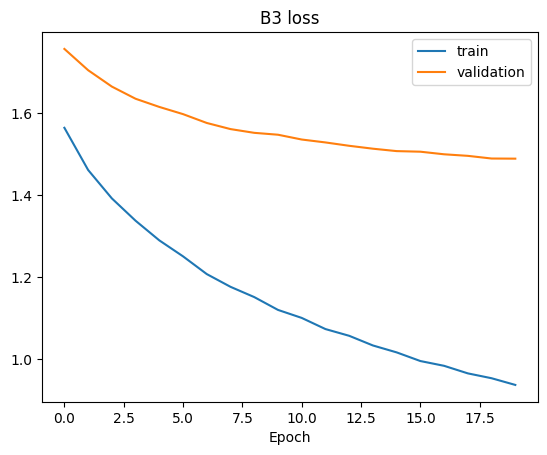

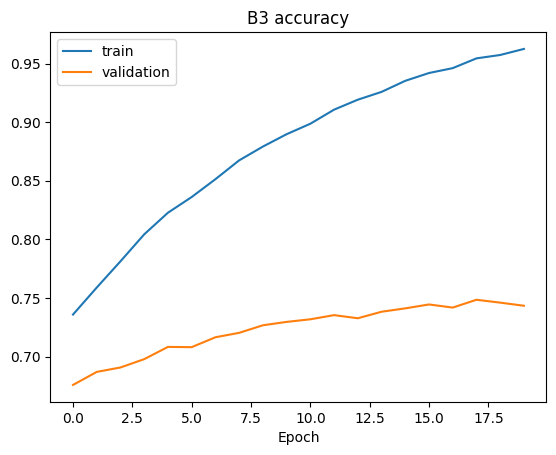

In [ ]:
plotHistory(historyB3, "B3")


In [ ]:
trueB3, predB3 = getPredictions(modelB3, valLoader)

print(f"B3 | accuracy {accuracy_score(trueB3, predB3):.3f} | macro F1 {f1_score(trueB3, predB3, average='macro'):.3f}")

B3 | accuracy 0.746 | macro F1 0.746


In [ ]:
print(classification_report(trueB3, predB3, target_names=selectedClasses, digits=3))


                     precision    recall  f1-score   support

              pizza      0.790     0.753     0.771       150
spaghetti_bolognese      0.804     0.820     0.812       150
spaghetti_carbonara      0.778     0.820     0.799       150
            lasagna      0.734     0.700     0.717       150
            ravioli      0.645     0.593     0.618       150
              steak      0.673     0.673     0.673       150
          hamburger      0.717     0.693     0.705       150
     baby_back_ribs      0.710     0.733     0.721       150
      chicken_wings      0.828     0.800     0.814       150
     grilled_salmon      0.615     0.587     0.601       150
              sushi      0.627     0.773     0.693       150
            sashimi      0.807     0.807     0.807       150
              ramen      0.790     0.827     0.808       150
         fried_rice      0.876     0.800     0.836       150
          dumplings      0.851     0.800     0.825       150
           pancakes    

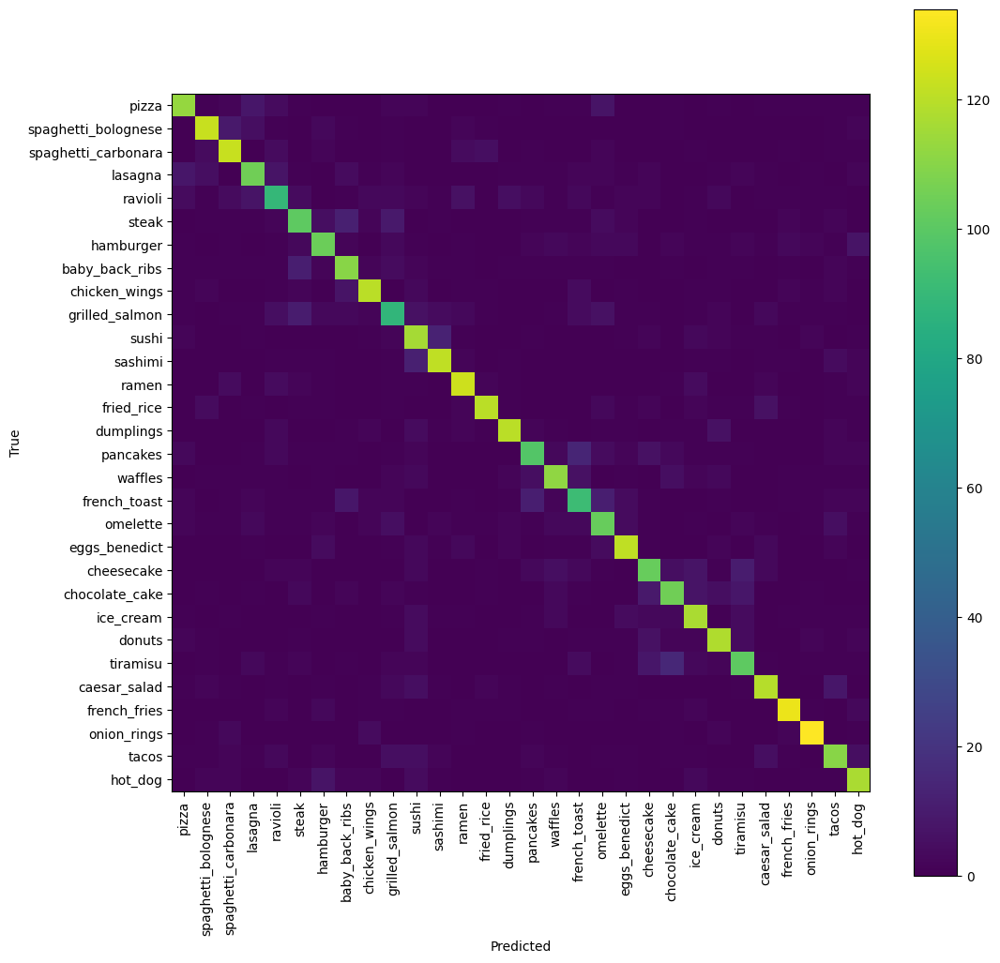

In [ ]:
cmB3 = confusion_matrix(trueB3, predB3)

plt.figure(figsize=(12, 12))
plt.imshow(cmB3)
plt.xticks(range(len(selectedClasses)), selectedClasses, rotation=90)
plt.yticks(range(len(selectedClasses)), selectedClasses)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.colorbar()
plt.show()

In [ ]:
mistakesB3 = []

for trueClass in range(len(selectedClasses)):
    for predictedClass in range(len(selectedClasses)):
        if trueClass != predictedClass:
            mistakesB3.append((
                cmB3[trueClass, predictedClass],
                selectedClasses[trueClass],
                selectedClasses[predictedClass]
            ))

mistakesB3.sort(reverse=True)

for count, trueClass, predictedClass in mistakesB3[:10]:
    print(f"{trueClass} -> {predictedClass}: {count}")

tiramisu -> chocolate_cake: 15
pancakes -> french_toast: 14
sushi -> sashimi: 13
steak -> baby_back_ribs: 12
sashimi -> sushi: 12
french_toast -> pancakes: 11
french_toast -> omelette: 11
baby_back_ribs -> steak: 11
grilled_salmon -> steak: 10
cheesecake -> tiramisu: 10


## Model B4 - stronger pretrained model

B3 nije poboljsao B2, pa sledece menjam backbone umesto da dodajem jos regularizacije.
B4 koristi pretrained ResNet50 i trenira samo `layer4 + fc`.

Checkpoint se ovde bira po validation accuracy, jer je to glavna metrika klasifikacije.

In [26]:
weightsB4 = ResNet50_Weights.DEFAULT

modelB4 = resnet50(weights=weightsB4)

for p in modelB4.parameters():
    p.requires_grad = False

modelB4.fc = nn.Linear(modelB4.fc.in_features, len(selectedClasses))

for p in modelB4.layer4.parameters():
    p.requires_grad = True

for p in modelB4.fc.parameters():
    p.requires_grad = True

modelB4 = modelB4.to(device)

print("trainable:", sum(p.numel() for p in modelB4.parameters() if p.requires_grad))


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 144MB/s]


trainable: 15026206


In [25]:
def trainModelB4(model, name, maxEpochs=12):
    criterion = nn.CrossEntropyLoss()

    optimizer = torch.optim.AdamW([
        {"params": model.layer4.parameters(), "lr": 3e-5},
        {"params": model.fc.parameters(), "lr": 3e-4}
    ], weight_decay=1e-4)

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="min", factor=0.5, patience=2
    )

    history = {
        "trainLoss": [], "trainAcc": [],
        "valLoss": [], "valAcc": [], "lr": []
    }

    bestValAcc = 0
    badEpochs = 0

    for epoch in range(maxEpochs):
        model.eval()
        model.layer4.train()
        model.fc.train()

        totalLoss = 0
        correct = 0
        total = 0

        for images, labels in trainLoader:
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()

            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

            totalLoss += loss.item() * images.size(0)
            correct += (outputs.argmax(1) == labels).sum().item()
            total += labels.size(0)

        trainLoss = totalLoss / total
        trainAcc = correct / total
        valLoss, valAcc = evaluate(model, valLoader, criterion)

        scheduler.step(valLoss)

        history["trainLoss"].append(trainLoss)
        history["trainAcc"].append(trainAcc)
        history["valLoss"].append(valLoss)
        history["valAcc"].append(valAcc)
        history["lr"].append(optimizer.param_groups[0]["lr"])

        improved = valAcc > bestValAcc

        if improved:
            bestValAcc = valAcc
            badEpochs = 0
        else:
            badEpochs += 1

        checkpoint = {
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "scheduler_state_dict": scheduler.state_dict(),
            "epoch": epoch + 1,
            "best_val_acc": bestValAcc,
            "history": history,
            "classes": selectedClasses
        }

        torch.save(checkpoint, name + "_last.pth")

        if improved:
            torch.save(checkpoint, name + "_best.pth")

        layerLR = optimizer.param_groups[0]["lr"]
        fcLR = optimizer.param_groups[1]["lr"]

        print(
            f"epoch {epoch + 1:02d} | "
            f"train {trainLoss:.4f} {trainAcc:.3f} | "
            f"val {valLoss:.4f} {valAcc:.3f} | "
            f"lr {layerLR:.1e}/{fcLR:.1e}"
        )

        if badEpochs >= 5:
            print("early stopping")
            break

    return history


### Train B4

Trening pokrecem samo ako checkpoint vec ne postoji.

In [27]:
if os.path.exists("modelB4_best.pth"):
    historyB4 = torch.load("modelB4_last.pth", map_location="cpu", weights_only=False)["history"]
    print("B4 loaded")
else:
    historyB4 = trainModelB4(modelB4, "modelB4")
    saveModels()


B4 loaded


## B4 rezultati

B4 proverava da li jaca pretrained reprezentacija daje bolji rezultat od ResNet18.

In [28]:
checkpointB4 = torch.load("modelB4_best.pth", map_location=device, weights_only=False)

modelB4 = resnet50(weights=None)
modelB4.fc = nn.Linear(modelB4.fc.in_features, len(selectedClasses))
modelB4.load_state_dict(checkpointB4["model_state_dict"])
modelB4 = modelB4.to(device)
modelB4.eval()
historyB4 = torch.load("modelB4_last.pth", map_location="cpu", weights_only=False)["history"]

print("B4 best epoch:", checkpointB4["epoch"])
print("B4 best val accuracy:", checkpointB4["best_val_acc"])


B4 best epoch: 12
B4 best val accuracy: 0.8368888888888889


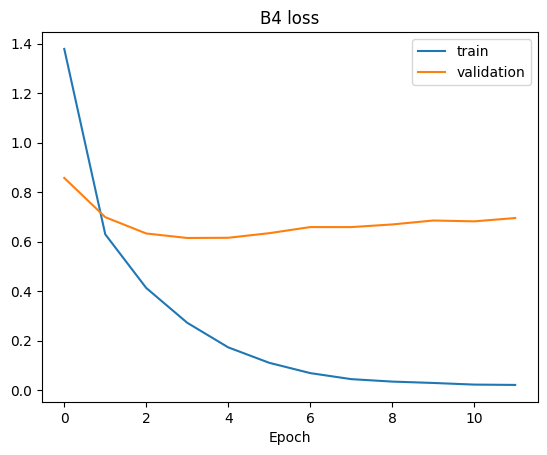

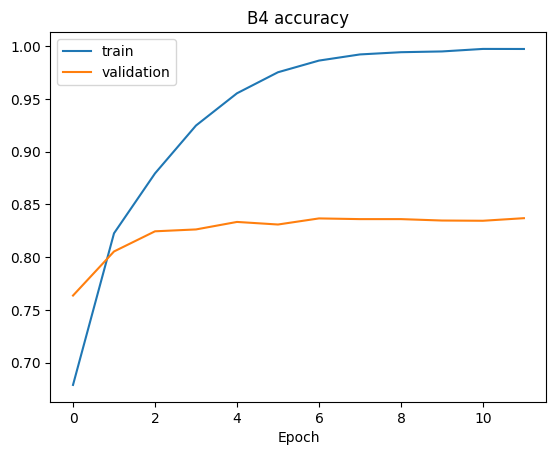

B4 | accuracy 0.837 | macro F1 0.837


In [29]:
plotHistory(historyB4, "B4")

trueB4, predB4 = getPredictions(modelB4, valLoader)
print(f"B4 | accuracy {accuracy_score(trueB4, predB4):.3f} | "
      f"macro F1 {f1_score(trueB4, predB4, average='macro'):.3f}")


In [30]:
printClassResults("B4", trueB4, predB4)


B4 best
onion_rings: 0.927
french_fries: 0.917
spaghetti_carbonara: 0.916
chicken_wings: 0.902
fried_rice: 0.893
B4 worst
grilled_salmon: 0.708
steak: 0.745
ravioli: 0.750
lasagna: 0.779
french_toast: 0.785


### Sta modeli testiraju

- A1: simple CNN od nule
- A2: dublji CNN + BatchNorm od nule
- B1: ResNet18 feature extraction
- B2: ResNet18 partial fine-tuning
- B3: regularized ResNet18 fine-tuning
- B4: ResNet50 partial fine-tuning

Finalni model biram na validation skupu.

# Architecture visualization

B1, B2 i B3 koriste istu ResNet18 arhitekturu; razlikuje se nacin treninga.
Vizualizacija je samo pomoc da se lakse vidi struktura mreze.

In [32]:
!pip -q install torchview


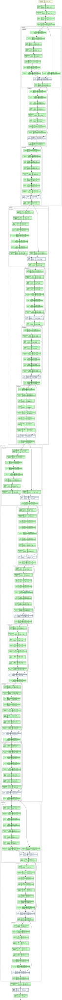

In [33]:
from torchview import draw_graph

modelToDraw = modelB4 if os.path.exists("modelB4_best.pth") else modelB2

modelGraph = draw_graph(
    modelToDraw,
    input_size=(1, 3, 224, 224),
    expand_nested=True
)

modelGraph.visual_graph


## Moj zakljucak

A2 je jasno poboljsao jednostavan A1, pa su dodatna dubina i BatchNorm imali smisla.
B1 je pokazao sta dobijam samo sa pretrained feature-ima, a B2 da je prilagodjavanje poslednjeg ResNet bloka vazno.

B3 nije poboljsao B2. Moj utisak je da je trening postao previse konzervativan:
manji learning rate i dodatna regularizacija su usporili adaptaciju.

Sledece bih probala jaci pretrained backbone, kao B4. Ako ni to ne donese jasan skok,
probala bih EfficientNet ili bolju augmentaciju. Grad-CAM bih koristila da proverim na koji deo slike se model oslanja.

# Finalno poredjenje svih modela

Do ovog trenutka nijedan model ne mora da bude u memoriji.
Svi checkpoint-i se ucitavaju iz `models.zip`, a ovde ih ponovo pravim i ucitavam tezine.

Sve modele poredim na istom validation skupu. Test jos ne koristim.

## Ucitavanje svih sest modela

Za svaki model proveravam i `_best` i `_last` checkpoint i zadrzavam onaj koji ima veci
validation accuracy. Ovo je korisno jer su stariji eksperimenti checkpoint cuvali po validation loss-u.

In [34]:
def makeModel(name):
    if name == "A1":
        return FoodCNN(len(selectedClasses))

    if name == "A2":
        return FoodCNN2(len(selectedClasses))

    if name == "B4":
        model = resnet50(weights=None)
    else:
        model = resnet18(weights=None)

    model.fc = nn.Linear(model.fc.in_features, len(selectedClasses))

    return model


def loadBestSaved(name):
    criterion = nn.CrossEntropyLoss()

    bestModel = None
    bestFile = None
    bestAcc = -1

    for suffix in ["best", "last"]:
        fileName = f"model{name}_{suffix}.pth"

        if not os.path.exists(fileName):
            continue

        checkpoint = torch.load(fileName, map_location=device, weights_only=False)

        model = makeModel(name)
        model.load_state_dict(checkpoint["model_state_dict"])
        model = model.to(device)
        model.eval()

        _, acc = evaluate(model, valLoader, criterion)

        if acc > bestAcc:
            bestAcc = acc
            bestModel = model
            bestFile = fileName

    print(name, "->", bestFile, f"{bestAcc:.3f}")

    return bestModel


models = {}

for name in ["A1", "A2", "B1", "B2", "B3", "B4"]:
    models[name] = loadBestSaved(name)

A1 -> modelA1_best.pth 0.522
A2 -> modelA2_best.pth 0.666
B1 -> modelB1_best.pth 0.672
B2 -> modelB2_last.pth 0.790
B3 -> modelB3_best.pth 0.722
B4 -> modelB4_best.pth 0.837


## Iste metrike za sve modele

Accuracy mi je glavna metrika, a macro F1 proverava da li rezultat nije dobar samo na lakim klasama.

In [35]:
criterion = nn.CrossEntropyLoss()

results = []
predictions = {}
reports = {}
matrices = {}
trueLabels = None

for name, model in models.items():
    valLoss, valAcc = evaluate(model, valLoader, criterion)

    trueLabels, predLabels = getPredictions(model, valLoader)

    macroF1 = f1_score(trueLabels, predLabels, average="macro")

    weightedF1 = f1_score(trueLabels, predLabels, average="weighted")

    predictions[name] = predLabels

    reports[name] = classification_report(trueLabels, predLabels, target_names=selectedClasses, output_dict=True, zero_division=0)

    matrices[name] = confusion_matrix(trueLabels,predLabels)

    results.append((name, valLoss, valAcc, macroF1, weightedF1))

results.sort(key=lambda x: x[2], reverse=True)

print(
    f"{'model':<5} "
    f"{'loss':>8} "
    f"{'acc':>8} "
    f"{'macro F1':>10} "
    f"{'weighted F1':>12}"
)

for name, loss, acc, macroF1, weightedF1 in results:
    print(
        f"{name:<5} "
        f"{loss:>8.4f} "
        f"{acc:>8.3f} "
        f"{macroF1:>10.3f} "
        f"{weightedF1:>12.3f}"
    )

model     loss      acc   macro F1  weighted F1
B4      0.6955    0.837      0.837        0.837
B2      0.8889    0.790      0.790        0.790
B3      1.0550    0.722      0.722        0.722
B1      1.1700    0.672      0.670        0.670
A2      1.1438    0.666      0.668        0.668
A1      1.6948    0.522      0.520        0.520


In [36]:
bestName = results[0][0]

print("best validation model:", bestName)

best validation model: B4


### Validation accuracy

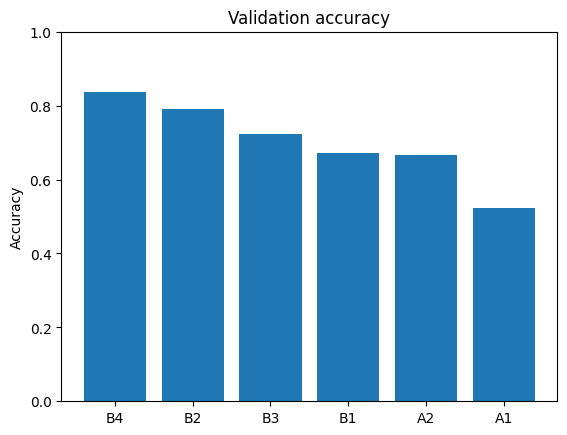

In [37]:
names = [row[0] for row in results]
accuracies = [row[2] for row in results]

plt.bar(names, accuracies)
plt.title("Validation accuracy")
plt.ylabel("Accuracy")
plt.ylim(0, 1)
plt.show()

### Krive treninga

Ovde poredim samo validation accuracy. B3 koristi drugaciji loss zbog label smoothing-a,
pa njegove loss vrednosti nisu direktno uporedive sa ostalim modelima.

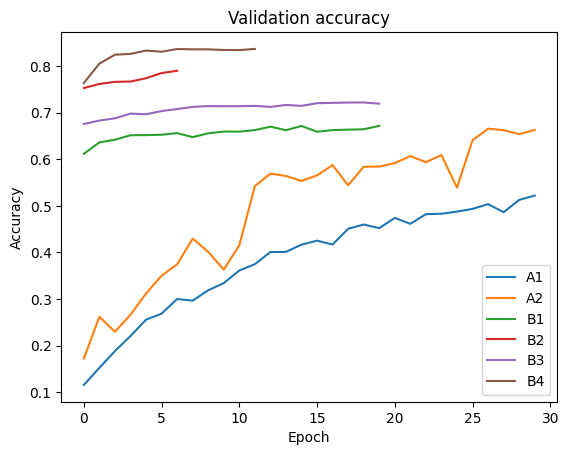

In [38]:
histories = {}

for name in models:
    fileName = f"model{name}_last.pth"
    histories[name] = torch.load(fileName, map_location="cpu", weights_only=False)["history"]

for name, history in histories.items():
    plt.plot(history["valAcc"], label=name)

plt.title("Validation accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

## Koje klase su teske svim modelima?

Ako ista klasa ima nizak F1 kroz vise razlicitih modela, problem verovatno nije samo jedna arhitektura.

In [39]:
classResults = []

for className in selectedClasses:
    scores = [reports[name][className]["f1-score"] for name in models]

    classResults.append((sum(scores) / len(scores),className))

classResults.sort()

for score, className in classResults[:10]:
    print(f"{className}: {score:.3f}")

grilled_salmon: 0.555
steak: 0.586
ravioli: 0.590
omelette: 0.594
french_toast: 0.617
lasagna: 0.635
tiramisu: 0.659
ice_cream: 0.660
tacos: 0.663
chocolate_cake: 0.667


## Zajednicke greske

Gledam confusion parove koji se pojavljuju medju najvećim greskama vise modela.
To mi pokazuje koje klase su stvarno teske, a ne samo problem jednog modela.

In [40]:
topMistakes = {}

for name in models:
    cm = matrices[name]
    mistakes = []

    for trueClass in range(len(selectedClasses)):
        for predictedClass in range(len(selectedClasses)):
            if trueClass != predictedClass:
                mistakes.append((cm[trueClass, predictedClass], trueClass, predictedClass))

    mistakes.sort(reverse=True)
    topMistakes[name] = mistakes[:10]


sharedMistakes = []

for trueClass in range(len(selectedClasses)):
    for predictedClass in range(len(selectedClasses)):
        if trueClass == predictedClass:
            continue

        modelCount = 0
        totalCount = 0

        for name in models:
            pairs = [(x[1], x[2]) for x in topMistakes[name]]

            if (trueClass, predictedClass) in pairs:
                modelCount += 1

            totalCount += matrices[name][trueClass, predictedClass]

        if modelCount >= 2:
            sharedMistakes.append((modelCount, totalCount, selectedClasses[trueClass],selectedClasses[predictedClass]))

sharedMistakes.sort(reverse=True)

for modelCount, count, trueClass, predictedClass in sharedMistakes[:12]:
    print(
        f"{trueClass} -> {predictedClass}: "
        f"{modelCount} models, {count} total"
    )

baby_back_ribs -> steak: 6 models, 115 total
tiramisu -> chocolate_cake: 6 models, 103 total
chocolate_cake -> tiramisu: 5 models, 86 total
sushi -> sashimi: 5 models, 85 total
steak -> grilled_salmon: 5 models, 73 total
steak -> baby_back_ribs: 3 models, 76 total
pancakes -> french_toast: 3 models, 68 total
cheesecake -> tiramisu: 3 models, 51 total
lasagna -> pizza: 2 models, 79 total
french_toast -> pancakes: 2 models, 64 total
grilled_salmon -> steak: 2 models, 63 total
spaghetti_bolognese -> spaghetti_carbonara: 2 models, 62 total


## Slike koje svi modeli pogrese

Ovo su najzanimljiviji primeri za vizuelnu proveru: svih sest modela je pogresilo istu sliku.

In [41]:
trueArray = np.array(trueLabels)

commonWrong = np.ones(
    len(trueArray),
    dtype=bool
)

for name in models:
    commonWrong &= (
        np.array(predictions[name]) != trueArray
    )

wrongIndices = np.where(commonWrong)[0]

print(
    "wrong for all six models:",
    len(wrongIndices)
)

wrong for all six models: 360


In [42]:
from io import BytesIO
from IPython.display import display, HTML
import base64


def showWrongImages(indices, count=20):
    count = min(count, len(indices))

    html = '''
    <div style="
        height: 750px;
        overflow-y: auto;
        border: 1px solid #ddd;
        padding: 15px;
    ">
    '''

    meanTensor = torch.tensor(mean)[:, None, None]
    stdTensor = torch.tensor(std)[:, None, None]

    for i in range(count):
        index = indices[i]
        image, label = valData[index]

        image = image * stdTensor + meanTensor
        image = image.clamp(0, 1)

        fig, ax = plt.subplots(figsize=(4, 4))
        ax.imshow(image.permute(1, 2, 0))
        ax.axis("off")
        ax.set_title(
            "true: " + selectedClasses[label]
        )

        buffer = BytesIO()
        fig.savefig(
            buffer,
            format="png",
            bbox_inches="tight"
        )
        plt.close(fig)

        image64 = base64.b64encode(
            buffer.getvalue()
        ).decode()

        predText = ""

        for name in models:
            pred = predictions[name][index]
            predText += (
                f"{name}: "
                f"{selectedClasses[pred]}<br>"
            )

        html += f'''
        <div style="
            text-align: center;
            margin-bottom: 35px;
        ">
            <img
                src="data:image/png;base64,{image64}"
                width="320"
            >
            <div style="font-size: 13px;">
                {predText}
            </div>
        </div>
        '''

    html += "</div>"

    display(HTML(html))


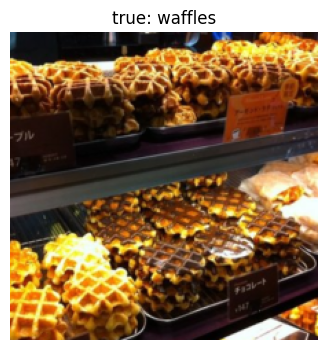
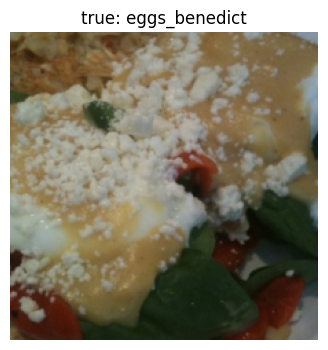
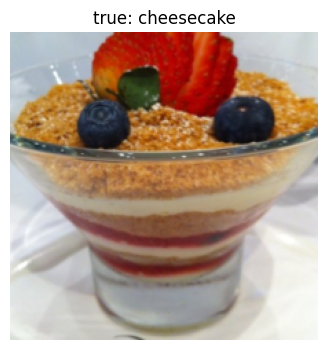
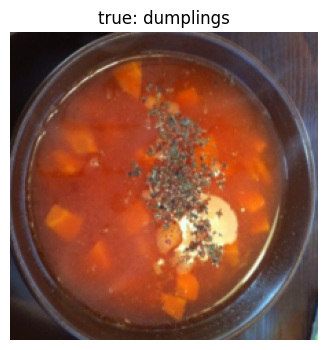
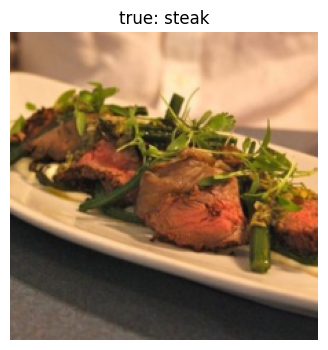
...
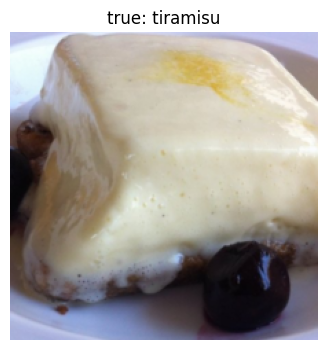
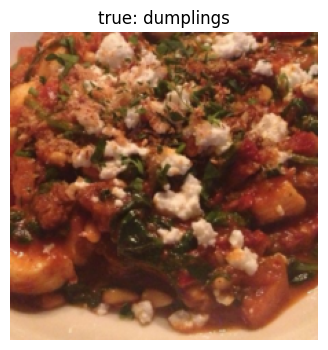
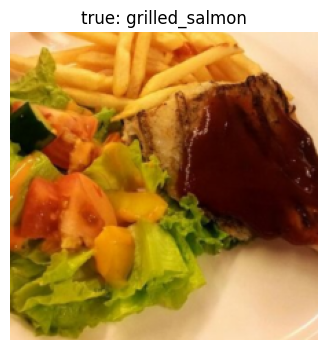
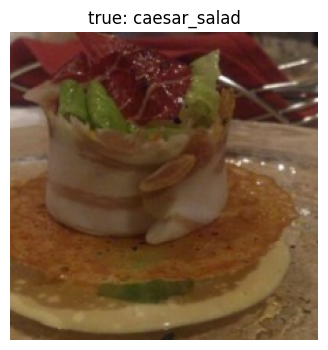
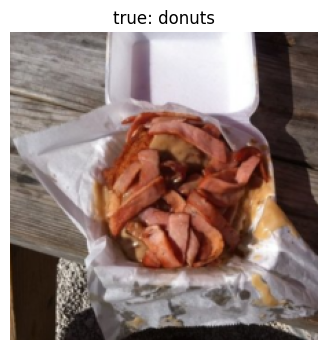

In [43]:
showWrongImages(wrongIndices, count=min(20, len(wrongIndices)))

In [ ]:
!pip -q install torchview

In [ ]:
from torchview import draw_graph

for name, model in models.items():
    print(name)

    graph = draw_graph(model, input_size=(1, 3, 224, 224), expand_nested=False)

    display(graph.visual_graph)

## Finalni test

In [44]:
bestModel = models[bestName]
trueTest, predTest = getPredictions(bestModel, testLoader)
testAcc = accuracy_score(trueTest, predTest)
testMacroF1 = f1_score(trueTest, predTest, average="macro")
testWeightedF1 = f1_score(trueTest, predTest, average="weighted")

print("final model:", bestName)
print(f"test accuracy: {testAcc:.3f}")
print(f"test macro F1: {testMacroF1:.3f}")
print(f"test weighted F1: {testWeightedF1:.3f}")

final model: B4
test accuracy: 0.884
test macro F1: 0.884
test weighted F1: 0.884


In [46]:
def getGradCAM(model, image):
    model.eval()

    x = image.unsqueeze(0).to(device)

    x = model.conv1(x)
    x = model.bn1(x)
    x = model.relu(x)
    x = model.maxpool(x)

    x = model.layer1(x)
    x = model.layer2(x)
    x = model.layer3(x)
    x = model.layer4(x)

    activations = x
    activations.retain_grad()

    x = model.avgpool(x)
    x = torch.flatten(x, 1)
    output = model.fc(x)

    predictedClass = output.argmax(1).item()

    model.zero_grad()
    output[0][predictedClass].backward()

    gradients = activations.grad

    weights = gradients.mean(dim=(2, 3), keepdim=True)
    cam = (activations * weights).sum(dim=1)

    cam = F.relu(cam)

    cam = F.interpolate(
        cam.unsqueeze(1),
        size=image.shape[1:],
        mode="bilinear",
        align_corners=False
    )[0][0]

    cam = cam - cam.min()
    cam = cam / (cam.max() + 1e-8)

    return cam.detach().cpu(), predictedClass

In [47]:
def showGradCAM(index):
    image, trueClass = valData[index]

    cam, predictedClass = getGradCAM(models["B4"], image)

    shownImage = image * torch.tensor(std)[:, None, None]
    shownImage = shownImage + torch.tensor(mean)[:, None, None]
    shownImage = shownImage.clamp(0, 1)

    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(shownImage.permute(1, 2, 0))
    plt.title(f"true: {selectedClasses[trueClass]}\npredicted: {selectedClasses[predictedClass]}")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(shownImage.permute(1, 2, 0))
    plt.imshow(cam, cmap="jet", alpha=0.4)
    plt.title("Grad-CAM")
    plt.axis("off")

    plt.show()

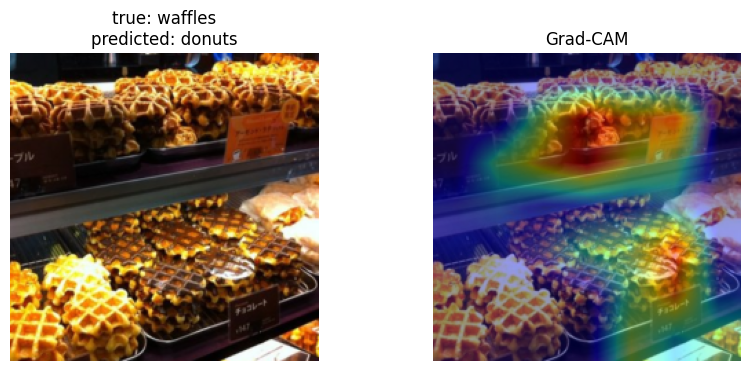

In [48]:
showGradCAM(0)

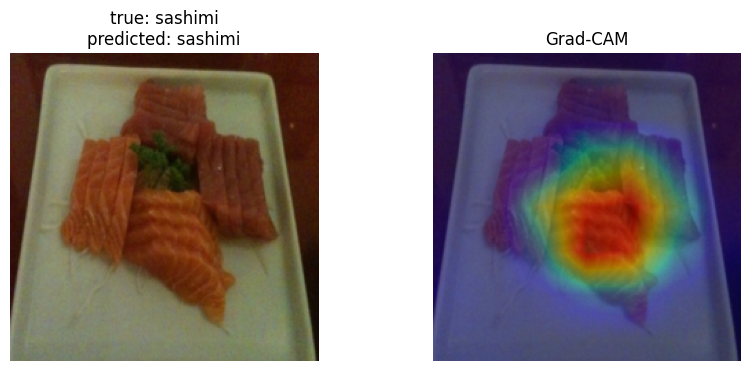

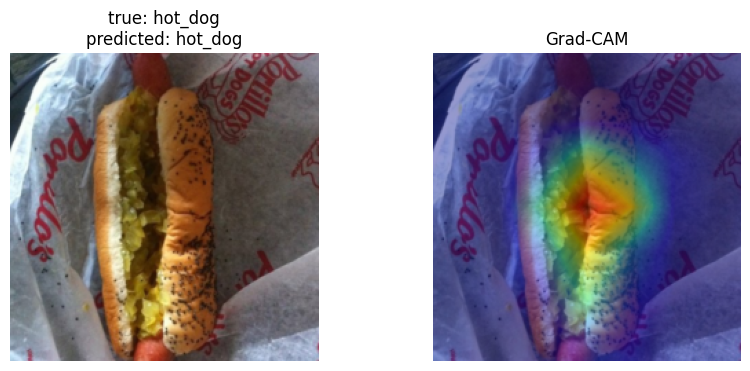

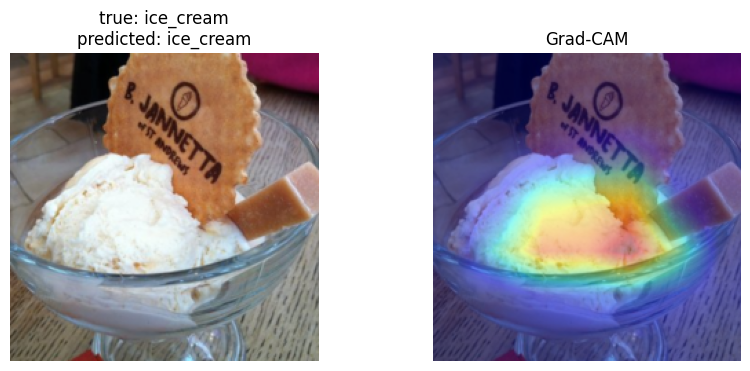

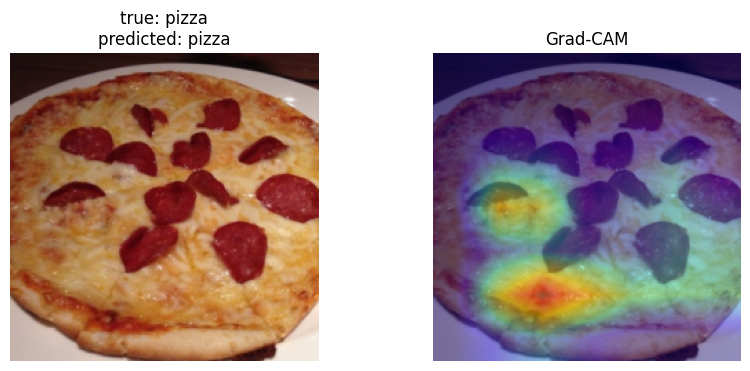

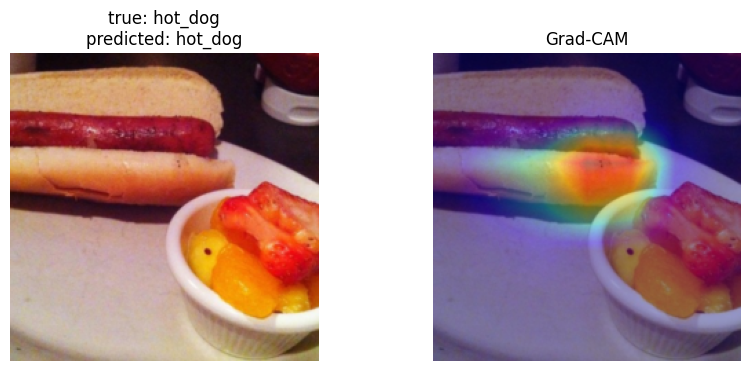

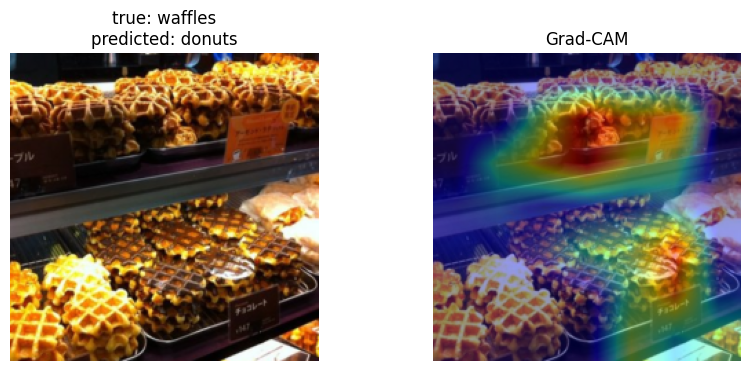

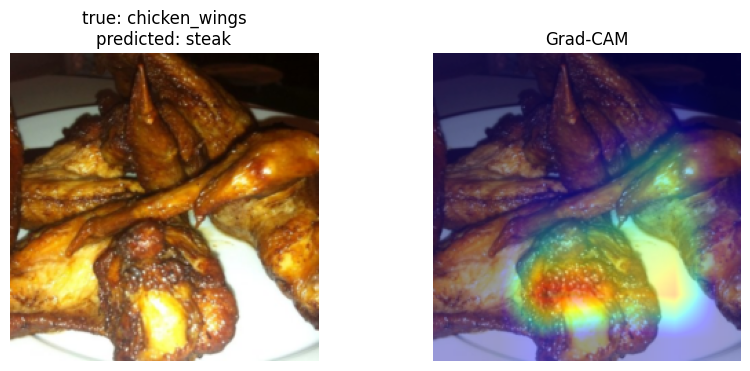

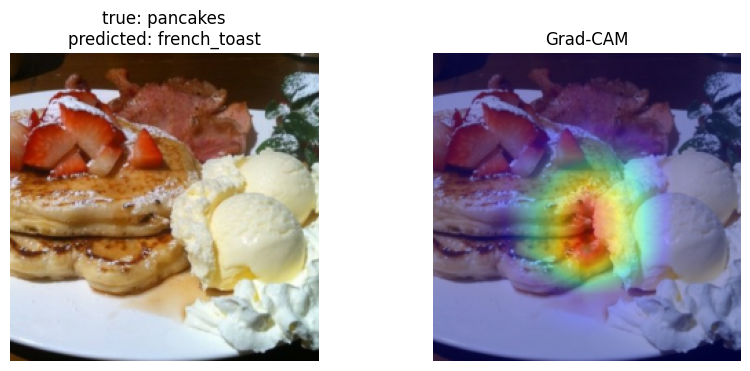

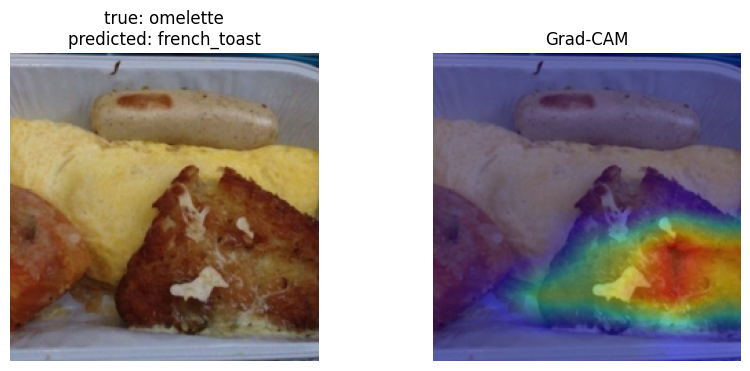

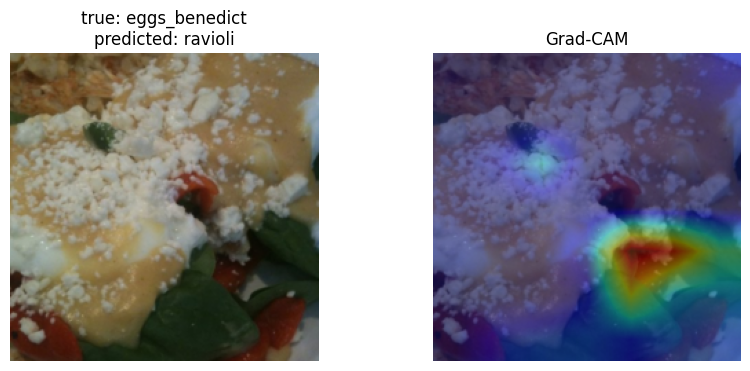

In [49]:
correctIndices = []
wrongIndicesB4 = []

for i in range(len(trueLabels)):
    if predictions["B4"][i] == trueLabels[i]:
        correctIndices.append(i)
    else:
        wrongIndicesB4.append(i)

for i in correctIndices[:5]:
    showGradCAM(i)

for i in wrongIndicesB4[:5]:
    showGradCAM(i)

Kod tacne predikcije model se uglavnom fokusira na samu hranu, dok tanjir i pozadina imaju mnogo manji uticaj.